<div id="container" style="position:relative;">
<div style="float:left"><h1> Mahyar Sabouniaghdam</h1></div>
<div style="position:relative; float:right"><img style="height:65px" src ="https://drive.google.com/uc?export=view&id=1EnB0x-fdqMp6I5iMoEBBEuxB_s7AmE2k" />
</div>
</div>

#### Gmail: saboonimahyar@gmail.com

#### LinkedIn Profile: https://www.linkedin.com/in/mahyar-sabouniaghdam/


# BrainStation Capstone Project : Stack Overflow Questions Quality Rating

## Table of Contents 
Part 1: [Background & Exploratory Data Analysis](#pt1) <br>
* [1. Background](#header11)
* [2. Breakdown of Data](#header12)
* [3. Importing Libraries](#header13)
* [4. Importing the Data](#header14)
* [5. High level description of data & EDA](#header15)
* [6. Feature Engineering](#header16) <br>

Part 2: [Data Preprocessing](#pt2) <br>
* [1. Tags Column](#header21)
* [2. Cleaning the text Data](#header22)
* [3. Sampling (Subsetting) the data](#header23) <br>

Part 3: [Modeling & Model Optimizing](#pt3) <br>
* [1. TF-IDF Vectorizing](#header31)
* [2. Baseline Models](#header32)
* [3. Model Optimization](#header33)
* [4. Advanced Modeling](#header34) 

Part 4: [Conclusion & Next Steps](#pt4) <br>
* [1. Final insights and models, next steps, and conclusion](#next)

Note: This notebook was run in the base environment.

# Part 1: Introduction & Exploratory Data Analysis <a id="pt1"></a>

## 1. Background <a id="header11"></a>

This is my Capstone project for BrainStation Data Science Bootcamp.



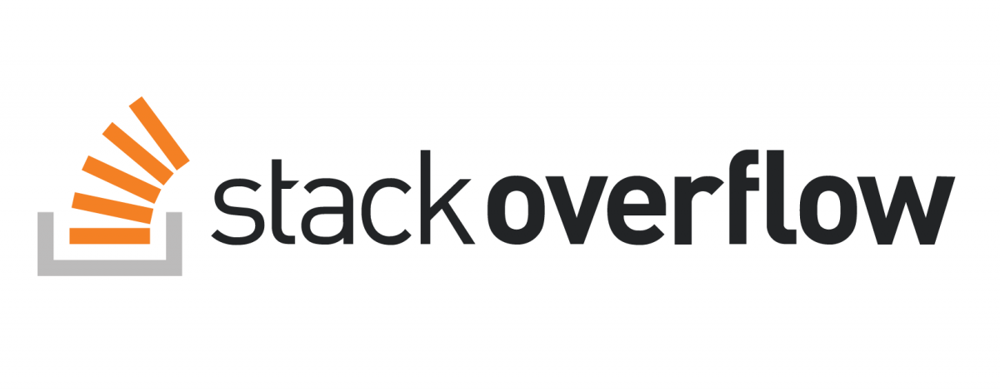

Stack Overflow is a question and answer community for programmers. It is designed to help programmers find solutions to their coding problems. To post a question, a user must create an account and provide a clear and concise description of the problem they are facing along with any relevant code snippets or error messages.

Once a question is posted, other users can respond with answers, comments, or additional questions to help clarify the issue. The person who asked the question can then select the best answer to mark as the accepted solution.

Questions can be closed for various reasons, including:

- Duplicate of an existing question
- Off-topic or not related to programming
- Lack of detail or clarity in the question
- Not a real question, but rather a statement or request for a tool or resource

Closing a question is typically done by moderators or high-reputation users, and the decision is based on the guidelines outlined in Stack Overflow's Code of Conduct and community policies. The goal is to maintain a high-quality, organized repository of programming knowledge for all users to benefit from.

### Objective of Capstone Project:
I aim to build an accurate and effective ML model to predict quality raing of  Stack Overflow questios Via the Quality Target'Y'.

### What value does this project bring:
With more than six thousand new questions asked on Stack Overflow every weekday. Currently about 6% of all new questions end up "closed". Questions can be closed as off topic, not constructive, not a real question, or too localized. More in depth descriptions of each reason can be found in the Stack Overflow FAQ. The exact duplicate close reason has been excluded from this contest, since it depends on previous questions. In my capstone project I am looking to add more sophisticated software solutions to moderation toolbox.



## 2. Breakdown of Dataset <a id="header12"></a>

### Source of the Data:

Data is collected from: https://github.com/Moradnejad/StackOverflow-Questions-Quality-Dataset

The dataset is also accessible at: https://www.kaggle.com/imoore/60k-stack-overflow-questions-with-quality-rate

### How to cite:

This is an original dataset, published under MIT License. Please cite the dataset for your usage as the following:

This is a dataset containing 60,000 Stack Overflow questions from 2016-2020. Questions are classified into three categories:

1. HQ: High-quality posts without a single edit.


2. LQ_EDIT: Low-quality posts with a negative score, and multiple community edits. However, they still remain open after those changes.


3. LQ_CLOSE: Low-quality posts that were closed by the community without a single edit.


- Notes:

 - Questions are sorted according to Question Id.
 - Question body is in HTML format.
 - All dates are in UTC format.

### Data Dictionary:

The dataset is divided to train (45k) and validation (15k) datasets.

Independent Variables:
- `Id:` Id of the question
- `Title:` Question Title
- `Body:` Text body of the question
- `Tags:` Tags included for each question ( Max= 5 tags)
- `CreationDate:` From 1 JAN 2015 to 29 FEB 2020


Dependent Variable:
- `Y`: 3 Unique values HQ, LQ_EDIT, LQ_CLOSE

## 3. Importing Libraries <a id="header13"></a>

In [1]:
# installing wordcloud

!pip install wordcloud

In [2]:
# import relevant packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

from sklearn.model_selection import cross_val_score
from bs4 import BeautifulSoup as bsp
from collections import Counter
import re

import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA

from sklearn.feature_extraction.text import CountVectorizer
import nltk as nlp
import string
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors


## 4. Importing the Data <a id="header14"></a>

In [3]:
# Read the data

train = pd.read_csv('train.csv')
test = pd.read_csv('valid.csv')

train.head()

,Id,Title,Body,Tags,CreationDate,Y
0,34552656,Java: Repeat Task Every Random Seconds,<p>I'm already familiar with repeating tasks e...,<java><repeat>,2016-01-01 00:21:59,LQ_CLOSE
1,34553034,Why are Java Optionals immutable?,<p>I'd like to understand why Java 8 Optionals...,<java><optional>,2016-01-01 02:03:20,HQ
2,34553174,Text Overlay Image with Darkened Opacity React...,<p>I am attempting to overlay a title over an ...,<javascript><image><overlay><react-native><opa...,2016-01-01 02:48:24,HQ
3,34553318,Why ternary operator in swift is so picky?,"<p>The question is very simple, but I just cou...",<swift><operators><whitespace><ternary-operato...,2016-01-01 03:30:17,HQ
4,34553755,hide/show fab with scale animation,<p>I'm using custom floatingactionmenu. I need...,<android><material-design><floating-action-but...,2016-01-01 05:21:48,HQ


In [4]:
# The shape of the data

print(f'Train dataset consists of {train.shape[0]} rows, and {train.shape[1]} columns')

Train dataset consists of 45000 rows, and 6 columns


In [5]:
# The shape of the data

print(f'Test dataset consists of {test.shape[0]} rows, and {test.shape[1]} columns')

Test dataset consists of 15000 rows, and 6 columns


## 5. High level description of data & EDA <a id="header15"></a>

In [6]:
# Check data types

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Id            45000 non-null  int64 
 1   Title         45000 non-null  object
 2   Body          45000 non-null  object
 3   Tags          45000 non-null  object
 4   CreationDate  45000 non-null  object
 5   Y             45000 non-null  object
dtypes: int64(1), object(5)
memory usage: 2.1+ MB


- Distribution of the target column:

In [7]:
train['Y'].value_counts()

LQ_CLOSE    15000
HQ          15000
LQ_EDIT     15000
Name: Y, dtype: int64

In [8]:
train['Y'].value_counts(normalize = True)

LQ_CLOSE    0.333333
HQ          0.333333
LQ_EDIT     0.333333
Name: Y, dtype: float64

In [9]:
test['Y'].value_counts()

LQ_EDIT     5000
HQ          5000
LQ_CLOSE    5000
Name: Y, dtype: int64

In [10]:
test['Y'].value_counts(normalize = True)

LQ_EDIT     0.333333
HQ          0.333333
LQ_CLOSE    0.333333
Name: Y, dtype: float64

- Check for null values:

In [11]:
train.isna().sum()

Id              0
Title           0
Body            0
Tags            0
CreationDate    0
Y               0
dtype: int64

In [12]:
test.isna().sum()

Id              0
Title           0
Body            0
Tags            0
CreationDate    0
Y               0
dtype: int64

- Check for duplicate:

In [13]:
train.duplicated().value_counts()

False    45000
dtype: int64

In [14]:
test.duplicated().value_counts()

False    15000
dtype: int64

In [15]:
train.duplicated().T.value_counts()

False    45000
dtype: int64

In [16]:
test.duplicated().T.value_counts()

False    15000
dtype: int64

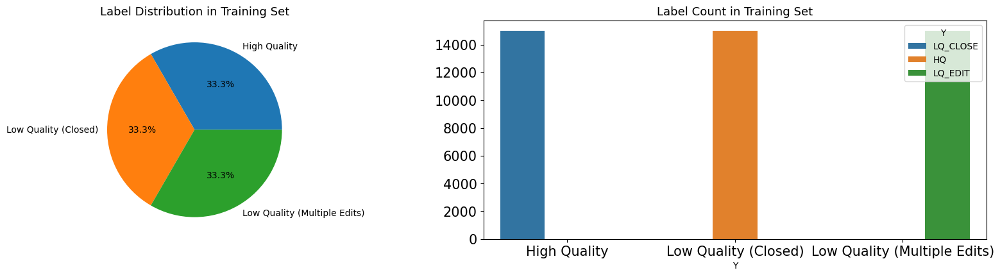

In [17]:
# Plotting the Y column

fig, axes = plt.subplots(ncols = 2, figsize = (17, 4), dpi = 100)
plt.tight_layout()

train.groupby('Y').count()['Id'].plot(kind = 'pie',autopct="%1.1f%%", ax = axes[0], labels = ['High Quality', 'Low Quality (Closed)', 'Low Quality (Multiple Edits)'])
sns.countplot(x = train['Y'], hue = train['Y'], ax = axes[1])

axes[0].set_ylabel('')
axes[1].set_ylabel('')
axes[1].set_xticklabels(['High Quality', 'Low Quality (Closed)', 'Low Quality (Multiple Edits)'])
axes[0].tick_params(axis = 'x', labelsize = 15)
axes[0].tick_params(axis = 'y', labelsize = 15)
axes[1].tick_params(axis = 'x', labelsize = 15)
axes[1].tick_params(axis = 'y', labelsize = 15)

axes[0].set_title('Label Distribution in Training Set', fontsize = 13)
axes[1].set_title('Label Count in Training Set', fontsize = 13)

plt.show()


## 6. Feature Enginering <a id="header16"></a>

- Let's create hour, day, month and year columns to explore the distribution of target column in different hours, days, months and years and I think they maybe have effect on target value:

In [18]:
# Write some functions to extract hour, day, month and year from CreationDate column:

def get_hour(ts):
    return ts.hour
def get_day(ts):
    return ts.weekday()
def get_month(ts):
    return ts.month
def get_year(ts):
    return ts.year


In [19]:
# TRAIN 

# Change data type of creationdate column to datetime
train['CreationDate'] = pd.to_datetime(train['CreationDate'])

# Extracting hour, day, month and year 
train['Creation_Hour'] = train['CreationDate'].apply(get_hour)
train['Creation_Weekday'] = train['CreationDate'].apply(get_day)
train['Creation_Month'] = train['CreationDate'].apply(get_month)
train['Creation_Year'] = train['CreationDate'].apply(get_year)

# Drop CrationDate column
train.drop(columns=['CreationDate'],inplace=True)

In [20]:
# TEST

# Change data type of creationdate column to datetime
test['CreationDate'] = pd.to_datetime(test['CreationDate'])

# Extracting hour, day, month and year 
test['Creation_Hour'] = test['CreationDate'].apply(get_hour)
test['Creation_Weekday'] = test['CreationDate'].apply(get_day)
test['Creation_Month'] = test['CreationDate'].apply(get_month)
test['Creation_Year'] = test['CreationDate'].apply(get_year)

# Drop CrationDate column
test.drop(columns=['CreationDate'],inplace=True)

In [21]:
# Hour distribution

train['Creation_Hour'].value_counts(normalize = True)

13    0.057356
14    0.056044
15    0.055289
11    0.055156
12    0.055111
9     0.054933
10    0.054711
16    0.051667
17    0.049133
18    0.048489
8     0.046244
19    0.046222
7     0.045444
20    0.042867
21    0.038489
6     0.038356
22    0.033000
5     0.030733
23    0.027044
4     0.026022
3     0.023067
2     0.022867
0     0.021422
1     0.020333
Name: Creation_Hour, dtype: float64

In [22]:
# Weekday distribution

train['Creation_Weekday'].value_counts(normalize = True)

2    0.167356
1    0.165378
3    0.163444
0    0.154333
4    0.153844
5    0.099400
6    0.096244
Name: Creation_Weekday, dtype: float64

In [23]:
# Month distribution

train['Creation_Month'].value_counts(normalize = True)

1     0.107511
2     0.104933
3     0.100356
5     0.086000
9     0.083400
8     0.080489
4     0.080467
6     0.079467
7     0.076956
10    0.073600
12    0.065044
11    0.061778
Name: Creation_Month, dtype: float64

In [24]:
# Year distribution

train['Creation_Year'].value_counts(normalize = True)

2016    0.338689
2017    0.268956
2018    0.229911
2019    0.143511
2020    0.018933
Name: Creation_Year, dtype: float64

- Let's create number of words, number of charachter and average word length columns for title and body columns without stopwords in english. I believe number of words may have affect on the target column:

In [25]:
# create a variable for english stopwords
eng_sw =set(nlp.corpus.stopwords.words('english'))

# function for charachter amount 
def get_char_amount(val):
    return len(val)


# function for average word length ( number of char/ number of words)
def average_word_length(val):
    splited = val.split(' ')
    char_count = 0
    word_count = 0
    for word in splited:
        if word not in eng_sw:
            char_count =char_count + len(word)
            word_count = word_count+1
    return char_count/word_count


# function for number of words
def number_of_words(val):
    splited = val.split(' ')
    char_count = 0
    word_count = 0
    for word in splited:
        if word not in eng_sw:
            word_count = word_count+1
    return word_count    

In [26]:
# Creating new columns from Body and Title columns for Train

train['Body_Char_Length'] = train['Body'].apply(get_char_amount)
train['Title_Char_Length'] = train['Title'].apply(get_char_amount)
train['Body_Avg_Word_Length'] = train['Body'].apply(average_word_length)
train['Title_Avg_Word_Length'] = train['Title'].apply(average_word_length)
train['Body_Num_Of_Words'] = train['Body'].apply(number_of_words)
train['Title_Num_Of_Words'] = train['Title'].apply(number_of_words)

In [27]:
# Creating new columns from Body and Title columns for Test

test['Body_Char_Length'] = test['Body'].apply(get_char_amount)
test['Title_Char_Length'] = test['Title'].apply(get_char_amount)
test['Body_Avg_Word_Length'] = test['Body'].apply(average_word_length)
test['Title_Avg_Word_Length'] = test['Title'].apply(average_word_length)
test['Body_Num_Of_Words'] = test['Body'].apply(number_of_words)
test['Title_Num_Of_Words'] = test['Title'].apply(number_of_words)

- Now let's find out how many tags each question have? I believe maybe number of tags in each question have affect on quality of questions:

Note: questions can contain maximum of 5 tags. 

In [28]:
# Function for splitting tags with space and cleaning them

def tag_cleaner(val):
    splited = val.split('><')
    clean = []
    for tag in splited:
        tag =  tag.replace('<',' ')
        tag =  tag.replace('>',' ')
        clean.append(tag)
    return set(clean)


In [29]:
# The number of tags in a question for Train

num_of_tags = []

for tag in train['Tags']:
    clean_tag = list(tag_cleaner(tag))
    num_of_tags.append(len(clean_tag))
train['Number_Of_Tags'] = num_of_tags

In [30]:
# The number of tags in a question for Test

num_of_tags = []

for tag in test['Tags']:
    clean_tag = list(tag_cleaner(tag))
    num_of_tags.append(len(clean_tag))
test['Number_Of_Tags'] = num_of_tags

- Let's see the distribution of number of tags:

In [31]:
test['Number_Of_Tags'].value_counts()

2    4555
3    3988
1    2637
4    2356
5    1464
Name: Number_Of_Tags, dtype: int64

In [32]:
train['Number_Of_Tags'].value_counts()

2    13759
3    11940
1     8410
4     6779
5     4111
6        1
Name: Number_Of_Tags, dtype: int64

We see that one of the question have 6 tags and in the dataset notes it says that we can only have 5 tags. So let's drop it:

In [33]:
train['Tags'][train['Number_Of_Tags']==6]

36481    <javascript><php><html><html-email><forms><htt...
Name: Tags, dtype: object

In [34]:
train.drop(train.loc[train['Number_Of_Tags']==6].index, inplace=True)

In [35]:
train['Number_Of_Tags'].value_counts()

2    13759
3    11940
1     8410
4     6779
5     4111
Name: Number_Of_Tags, dtype: int64

- Now let's see some descriptive statistics summary of numeric columns:

In [36]:
train.describe()

,Id,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Char_Length,Title_Char_Length,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,Number_Of_Tags
count,4.499900e+04,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000,44999.000000
mean,4.575599e+07,12.407009,2.680260,5.976288,2017.235027,989.025156,53.778906,7.135180,6.165325,160.344585,6.400809,2.653815
std,7.120030e+06,6.000883,1.879744,3.448238,1.121535,1533.397661,22.155916,11.836437,1.879816,406.463874,2.511890,1.203994
min,3.455266e+07,0.000000,0.000000,1.000000,2016.000000,33.000000,15.000000,0.103242,1.428571,1.000000,1.000000,1.000000
25%,3.973586e+07,8.000000,1.000000,3.000000,2016.000000,328.000000,38.000000,4.864763,5.142857,31.000000,5.000000,2.000000
50%,4.503522e+07,13.000000,3.000000,6.000000,2017.000000,586.000000,50.000000,6.500000,5.857143,61.000000,6.000000,3.000000
75%,5.125457e+07,17.000000,4.000000,9.000000,2018.000000,1084.000000,65.000000,8.583333,6.792857,143.000000,8.000000,3.000000
max,6.046802e+07,23.000000,6.000000,12.000000,2020.000000,36718.000000,150.000000,2233.666667,122.000000,18793.000000,29.000000,5.000000


- I saw that some of the rows in Body column (text of the question) has code block in them specified with code and <>. I believe it may have affect on target column so I created the Code_Available column:

In [37]:
# function for avaolability of code
# 1 means yes and 0 means no

def code_available(content):
    
    if('<code>' in content):
        return 1
    
    return 0

In [38]:
train['Code_Available'] = train['Body'].apply(code_available)

In [39]:
test['Code_Available'] = test['Body'].apply(code_available)

In [40]:
test

,Id,Title,Body,Tags,Y,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Char_Length,Title_Char_Length,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,Number_Of_Tags,Code_Available
0,34552974,How to get all the child records from differen...,I am having 4 different tables like \r\nselect...,<sql><sql-server>,LQ_EDIT,1,4,1,2016,598,93,5.933333,5.000000,60,12,2,0
1,34554721,Retrieve all except some data of the another t...,I have two table m_master and tbl_appointment\...,<php><mysql><sql><codeigniter><mysqli>,LQ_EDIT,8,4,1,2016,204,50,11.666667,6.000000,15,5,5,0
2,34555135,Pandas: read_html,<p>I'm trying to extract US states from wiki U...,<python><pandas>,HQ,9,4,1,2016,1056,17,4.346369,8.000000,179,2,2,1
3,34555448,Reader Always gimme NULL,"I'm so new to C#, I wanna make an application ...",<sql-server><c#-4.0>,LQ_EDIT,10,4,1,2016,1497,24,1.554367,5.250000,561,4,2,0
4,34555752,php rearrange array elements based on condition,basically i have this array:\r\n\r\n array(...,<php>,LQ_EDIT,11,4,1,2016,1783,47,9.152439,6.500000,164,6,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,60465681,How can I align two flex boxes to follow each ...,"<p>I have a menu, and I'd like the div.right-c...",<html><css><flexbox>,LQ_CLOSE,13,5,2,2020,847,52,13.716981,4.125000,53,8,3,1
14996,60467932,C++ The correct way to multiply an integer and...,<p>I try to multiply an integer by a double bu...,<c++>,LQ_CLOSE,17,5,2,2020,997,55,6.373984,5.285714,123,7,1,1
14997,60468378,WHY DJANGO IS SHOWING ME THIS ERROR WHEN I TRY...,*URLS.PY*\r\n //URLS.PY FILE\r\n fro...,<django><django-views><django-templates>,LQ_EDIT,18,5,2,2020,1498,78,3.450000,3.937500,320,16,3,0
14998,60469392,PHP - getting the content of php page,<p>I have a controller inside which a server i...,<javascript><php><html>,LQ_CLOSE,20,5,2,2020,759,37,8.068493,4.166667,73,6,3,1


In [41]:
train

,Id,Title,Body,Tags,Y,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Char_Length,Title_Char_Length,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,Number_Of_Tags,Code_Available
0,34552656,Java: Repeat Task Every Random Seconds,<p>I'm already familiar with repeating tasks e...,<java><repeat>,LQ_CLOSE,0,4,1,2016,313,38,5.729730,5.500000,37,6,2,0
1,34553034,Why are Java Optionals immutable?,<p>I'd like to understand why Java 8 Optionals...,<java><optional>,HQ,2,4,1,2016,113,33,6.636364,6.500000,11,4,2,0
2,34553174,Text Overlay Image with Darkened Opacity React...,<p>I am attempting to overlay a title over an ...,<javascript><image><overlay><react-native><opa...,HQ,2,4,1,2016,4814,53,2.887858,6.000000,1186,7,5,1
3,34553318,Why ternary operator in swift is so picky?,"<p>The question is very simple, but I just cou...",<swift><operators><whitespace><ternary-operato...,HQ,3,4,1,2016,674,42,8.000000,5.800000,63,5,5,1
4,34553755,hide/show fab with scale animation,<p>I'm using custom floatingactionmenu. I need...,<android><material-design><floating-action-but...,HQ,5,4,1,2016,384,34,16.047619,6.500000,21,4,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,60461435,Convert List<String> to string C# - asp.net - ...,<p>I am new to this and I am asking for help t...,<c#><asp.net><sql-server>,LQ_CLOSE,2,5,2,2020,884,58,12.457627,4.600000,59,10,3,1
44996,60461754,Does Python execute code from the top or botto...,<p>I am working on learning Python and was won...,<python>,LQ_CLOSE,3,5,2,2020,188,61,5.882353,5.142857,17,7,1,0
44997,60462001,how to change payment date in Azure?,<p>It looks like it costs 8 days per month in ...,<azure><billing>,LQ_CLOSE,4,5,2,2020,145,36,4.904762,5.750000,21,4,2,0
44998,60465318,how to implement fill in the blank in Swift,"<p>""I _____ any questions.""</p>\n\n<p>I want t...",<ios><swift>,LQ_CLOSE,12,5,2,2020,338,43,7.689655,5.750000,29,4,2,0


- I think that is enough for now. I came to 17 columns from 6 columns and I created 11 columns.

### Visualizations:

- Let's build histograms for our numerical columns:

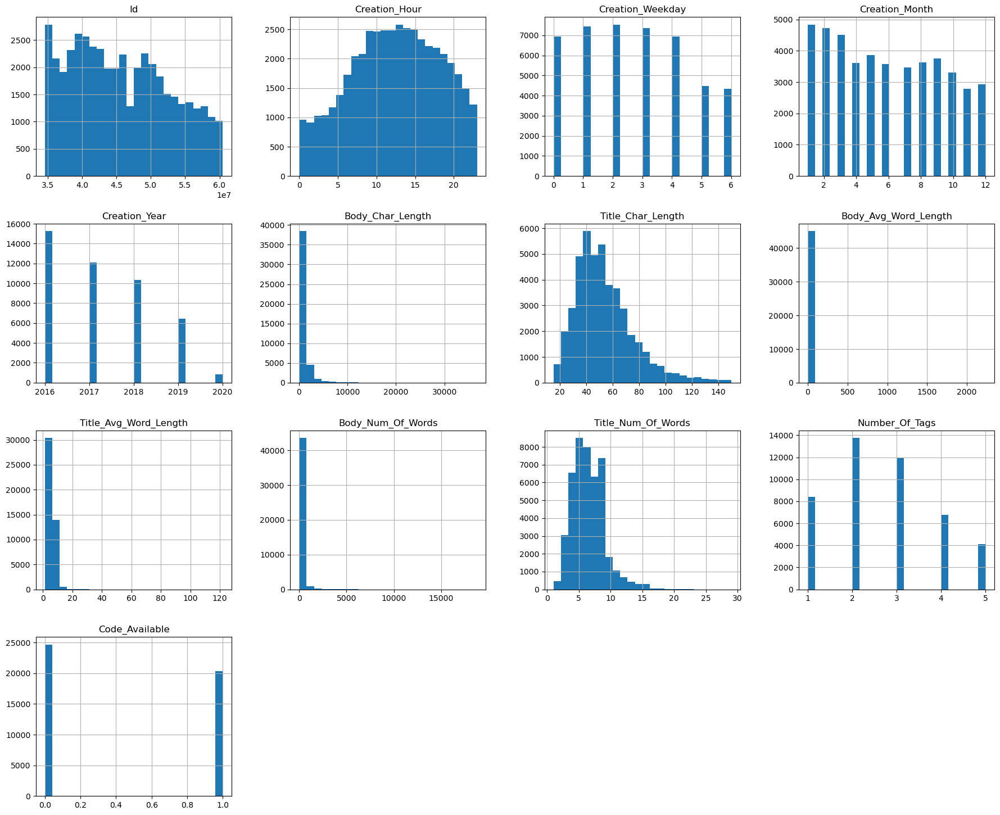

In [42]:
train.hist(bins=24, figsize=(22, 18))
plt.show()

# </font> <font color = magenta > Observations </font>

- Most of the questions are created in between 10-14 and most between 12-13 pm.

- People created more questions at weekdays comparing to weekends.

- number of question in beggining months are higher. Maybe because 2020 year has only Jan and Feb months.

- 2016 has highest number of questions.

- Most of the titles had between 4-6 words.

- most questions had 2 tags.

- lower number of questions had codes in them.

- Let's plot the boxplot for average word amount for body:

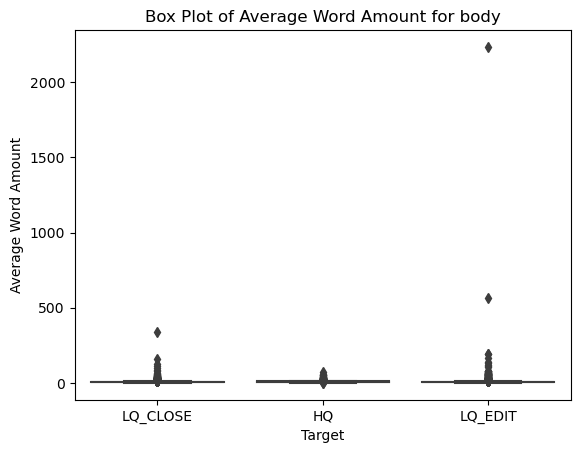

In [43]:
sns.boxplot(x='Y', y='Body_Avg_Word_Length', data=train)
plt.xlabel('Target')
plt.ylabel('Average Word Amount')
plt.title('Box Plot of Average Word Amount for body')
plt.show()

- here we can see that we have annomaly data. We should check them:

In [44]:
train['Body_Avg_Word_Length'][train['Body_Avg_Word_Length']> 500]

22040    2233.666667
26062     563.000000
Name: Body_Avg_Word_Length, dtype: float64

These 3 are outliers and let's drop them:

In [45]:
train.drop(train.loc[train['Body_Avg_Word_Length']> 500].index, inplace=True)

Let's plot the Average Length of words to observe how our target value is distributed in terms of average number of words in body:

(-1.0, 20.0)

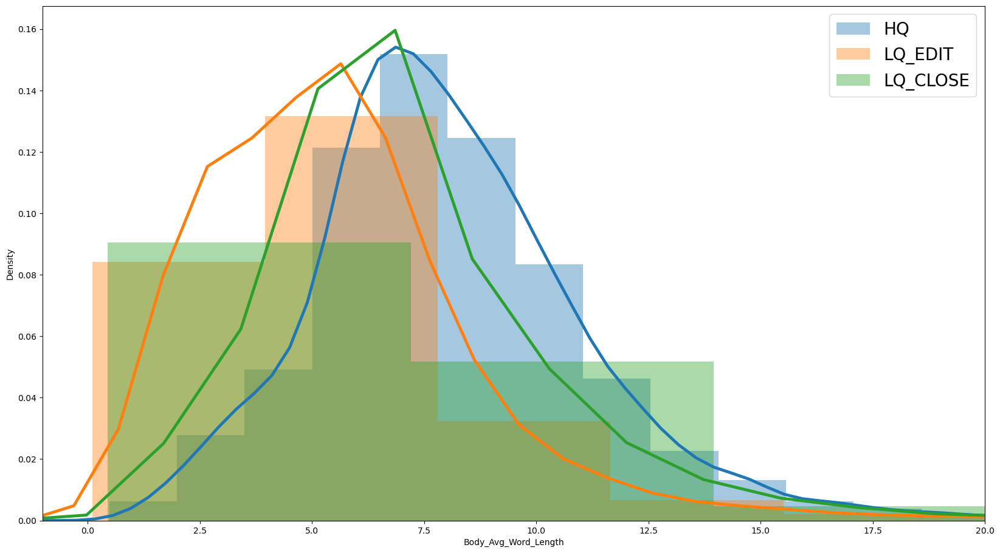

In [46]:
# Visualize with distplot

plt.figure(figsize=(20,11))

ax = sns.distplot(train[train['Y'] == 'HQ']['Body_Avg_Word_Length'],hist=True,kde_kws={'lw':3.5},label='HQ')
ax = sns.distplot(train[train['Y'] == 'LQ_EDIT']['Body_Avg_Word_Length'],hist=True,kde_kws={'lw':3.5},label='LQ_EDIT')
ax = sns.distplot(train[train['Y'] == 'LQ_CLOSE']['Body_Avg_Word_Length'],hist=True,kde_kws={'lw':3.5},label='LQ_CLOSE')
ax.legend(prop={'size':20})
plt.xlim(-1,20)


- The peak of average word length for body for High Quality questions are higher and it is 7.5. It means that people who used longer words and their words had more charachters, their questions were more likely to be a high quality question.

- On the other hand, we can see that low quality questions had low average word length which means the shorter and fewer words and charachters, the more chance of having a low quality question.

- Let's compare Body average word length for body and title:

Text(0.5, 0, 'Body and Title average word length')

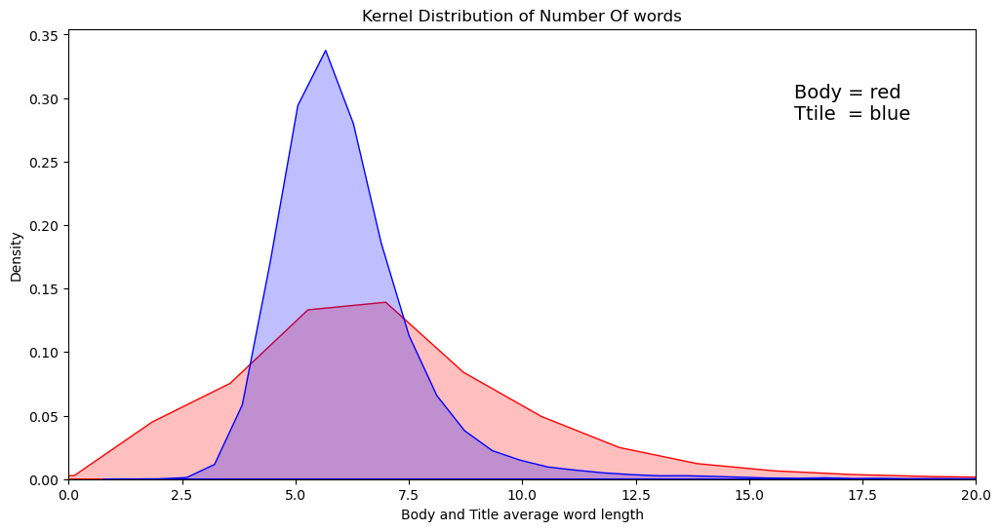

In [47]:


plt.figure(figsize=(12,6))
p1=sns.kdeplot(train['Body_Avg_Word_Length'], shade=True, color="r", label='Body').set_title('Kernel Distribution of Number Of words')
p1=sns.kdeplot(train['Title_Avg_Word_Length'], shade=True, color="b", label='Title')
plt.xlim(0,20)
plt.text(x=0.8, y=0.8, s="Body = red\nTtile  = blue", fontsize=14, transform=plt.gca().transAxes)
plt.xlabel('Body and Title average word length')

- As we can see here the number of titles are more dense than body and they are all gathered between 4-7.

- Interesting here is that the peak for both are at 7 and they are so close together.

- Let's plot distribution of target columns in year, month, weekday, hour: 

In [48]:
import plotly.express as px

fig = px.histogram(train,x='Creation_Year',title='Question\'s Quality year by year',color='Y',nbins=5,barmode = 'group')

fig.update_layout(height = 700)
fig.update_xaxes(categoryorder='category descending',title='Year').update_yaxes(title='Number of Questions')

fig.show()

- In earlier years we have more high quality questions and when time passed, the number of high quality questions decreased. The reason maybe for more repetition in questions or more strictness of website owners.

In [49]:
import plotly.express as px

fig = px.histogram(train,x='Creation_Month',title='Question\'s Quality month by month',color='Y',nbins=12,barmode = 'group')

fig.update_layout(height = 700)
fig.update_xaxes(categoryorder='category descending',title='Month').update_yaxes(title='Number of Questions')

fig.show()

- Beginning months have more high quality questions.

In [50]:
import plotly.express as px

fig = px.histogram(train,x='Creation_Weekday',title='Question\'s Quality in weekday',color='Y',nbins=7,barmode = 'group')

fig.update_layout(height = 700)
fig.update_xaxes(categoryorder='category descending',title='Weekdays').update_yaxes(title='Number of Questions')

fig.show()

- In weekends the portion of high quality questions are lower than low quality questions.

In [51]:
import plotly.express as px

fig = px.histogram(train,x='Creation_Hour',title='Question\'s Quality in 24 hour',color='Y',nbins=24,barmode = 'group')

fig.update_layout(height = 700)
fig.update_xaxes(categoryorder='category descending',title='Hour').update_yaxes(title='Number of Questions')

fig.show()

-  Let's have a better visualization for hour:

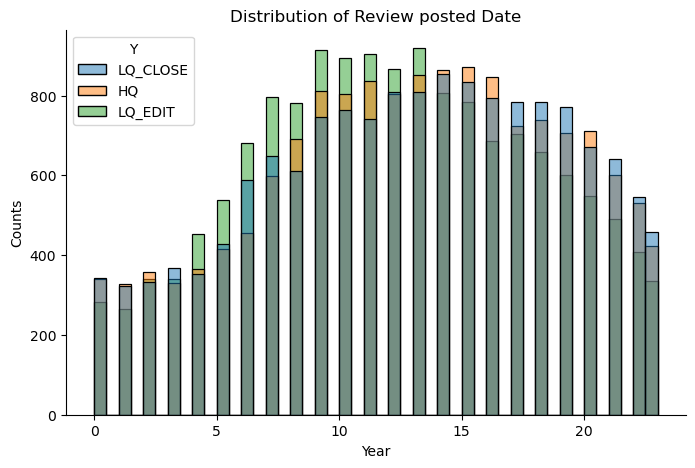

In [52]:
#Checking the distribution of the Dates when reviews were posted

plt.figure(figsize=(8, 5))

sns.histplot(train, x='Creation_Hour', hue='Y')
plt.title('Distribution of Review posted Date')
plt.ylabel('Counts')
plt.xlabel('Year')
sns.despine()

#Saving the plot for Capstone Presentation and Report
plt.savefig('Distribution of Review posted Date by Class.jpeg', bbox_inches='tight')

plt.show()

- As we can see here that the questions created at nights are more likely to be closed question.( the blue colors on top)

- Relationship between number of tags and quality of the questions:

In [53]:
import plotly.express as px

fig = px.histogram(train,x='Number_Of_Tags',title='Question\'s Quality based on number of tags',color='Y',nbins=5,barmode = 'group')

fig.update_layout(height = 700)
fig.update_xaxes(categoryorder='category descending',title='Number of Tags').update_yaxes(title='Number of Questions')

fig.show()

- We can see here that the more number of tags we have, the more chance to have a high quality question.

Let's observe the code availibity column:

In [54]:
train['Code_Available'].value_counts(normalize = True)

0    0.547637
1    0.452363
Name: Code_Available, dtype: float64

- 55% of questions have code.

In [55]:
import plotly.express as px

fig = px.histogram(train,x='Code_Available',title='Question\'s Quality based of code availablity',color='Y',nbins=2,barmode = 'group')

fig.update_layout(height = 700)
fig.update_xaxes(categoryorder='category descending',title='Code Available').update_yaxes(title='Number of Questions')

fig.show()

- As we can see here when we have code in our question, the chance of having a High Quality question is the highest and when we do not have code in our question, the chance of having a High Quality question is lowest.



- So, Code_Availability is a decisive column for predicting high quality questions.

# Data Preprocessing <a id="pt2"></a>

## 1. Tags Column: <a id="header21"></a>

- Let's see how many unique tags do we have:

In [56]:
# number of unique tags

allTags = train['Tags'].apply(lambda x:x.replace('<','').replace('>',' ').lower())
allTags = list(allTags.values)
allTags = ''.join(allTags)
count = Counter(allTags.split())
len(count) # unique Tags

9336

- Let's find the most repeated ones in our dataset:

In [57]:
# Making a dataframe for number of tags

count = pd.DataFrame(list(dict(count).items()),columns = ['Technology','Count'])
count.astype({'Count':'int64'})

count.sort_values('Count',axis =0,ascending = False,inplace = True)

- Let's show the ones higher than 300 times repeated:

In [58]:
# Frequency more than 300

count = count[count['Count']>=300]

In [59]:
# Plot the frequency of tags more than 400

fig = px.scatter(count, x = 'Technology',y='Count',size='Count',color='Count')

fig.update_layout(title='Technologie\'s have Frequency greater than 300',xaxis=dict(title='Technology'),yaxis=dict(title='No. of Questions'))

fig.show()

- Number of tags repeated more than 400 times:

In [60]:
# Number of tags repeated more than 300 times

tech = list(count['Technology'].values)
len(tech) # we have 23 multilabe which cover most of the questions

47

In [61]:
from sklearn.preprocessing import MultiLabelBinarizer

- **IMPORTANT NOTE: As it can be seen above, our dataset has 9336 unique tags which is alot. Performing One-Hot-encoding on them is not a correct approach because tags column can have up to 5 different values and one-hot-encoding extracts all the values at the same time. I tried to do MultLabelBinarization on Tags column and I faced MwmmoryError and it could not allocate a large amount of space( for me was 9.61 GB ) for an sparse array. So, I came up with the idea to Labeling the important tags by writing hard code. As it can be seen earlier the number of unique tags repeated more than 300 times is 47. So, I am going to create new columns and categorize the tags and allocate each tag to the related columns:**

First let's write a function to clean the tags:

In [62]:
# Cleaning tag function

def tag_cleaner(val):
    splited = val.split('><')
    clean = []
    for tag in splited:
        tag =  tag.replace('<',' ')
        tag =  tag.replace('>',' ')
        clean.append(tag)
    return set(clean)

- Make a set to make tags unique and clean:

In [63]:
# all unique tags:

unique_tags = set()

for tag in train['Tags']:
    unique_tags = unique_tags|tag_cleaner(tag)

- Categorize the tags:

In [64]:
# Tags categorization

google_related      = []
prog_lang_related   = []
app_related         = []
ml_dl_related       = []
cs_am_related       = []
db_related          = []
web_dev_related     = []
electronics_related = []

prog_langs = ['swift','basic','c#','f#','c++','java','python','kotlin','camel','coffee','perl',
             'lisp','ruby','visual-studio','azure','assembly','go','haskell',',rust','.net','spyder',
             'jcl','sap','opengl','jenkins','apache','verilog','numpy']

web_keys = ['js','.j','net','docker','server','web','webpage','chrome','firefox','rest','api',
           'angular','react','node','facebook','twitter','amazon-ses','chromium','browser','ntp','svn',
           'xml','explorer','kivy','php']

app_android = ['android','apk','sdk','ipad','iphone','ios']

db_keys = ['db','sql','query','mongo','nosql','json','database','cloud','sql-server']
ml_dl_keys = ['tensorflow','machine_learning','deep_learning','scatter-plot','opencv','lda',
             'mlmodel','regression','principal-components','pca','pytorch','sklearn','face-recognition',
             ]
electronics_keys = ['esp8266','cpu','ram','core','tsu','gpu','arduino','raspberry']
cs_am_keys  = ['optimization','x509','class','array','sort','algorithm','code','runtime','header-files',
             'calculus','theory','geometry','polynomial']

c_unique_tags = unique_tags.copy()
c_unique_tags = list(c_unique_tags)
c_unique_tags = [tag.strip() for tag in c_unique_tags]

#google realted

for tag in c_unique_tags:
    if 'google'  in tag:
        google_related.append(tag)
c_unique_tags = [tag for tag in c_unique_tags if tag not in google_related]

#prog_lang realted

for tag in c_unique_tags:
    s_flag = False
    for plang in prog_langs:
        if s_flag is True:
            break;
        elif tag.find(plang) != -1:
            prog_lang_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in prog_lang_related]

#web_dev realted

for tag in c_unique_tags:
    s_flag = False
    for wk in web_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            web_dev_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in web_dev_related]

#phone/app_dev realted

for tag in c_unique_tags:
    s_flag = False
    for wk in app_android:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            app_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in app_related]

#database realted

for tag in c_unique_tags:
    s_flag = False
    for wk in db_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            db_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in db_related]

# machine learning and deep learning realted

for tag in c_unique_tags:
    s_flag = False
    for wk in ml_dl_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            ml_dl_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in ml_dl_related]


#electronics realted

for tag in c_unique_tags:
    s_flag = False
    for wk in electronics_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            electronics_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in electronics_related]

#cs_am realted

for tag in c_unique_tags:
    s_flag = False
    for wk in cs_am_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            cs_am_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in cs_am_related]

In [65]:
# Making lists of our categories

google_related_col = []    
prog_lang_related_col = []  
app_related_col = []        
ml_dl_related_col = []      
cs_am_related_col = []      
db_related_col = []         
web_dev_related_col = []    
electronics_related_col = []
other_related_col = []

- Creating our new columns:

In [66]:
# Function to assign each tag to the related category

for tag in train['Tags']:
    clean_tag = list(tag_cleaner(tag))
    google_related_score =0   
    prog_lang_related_score =0  
    app_related_score =0        
    ml_dl_related_score =0      
    cs_am_related_score =0      
    db_related_score =0         
    web_dev_related_score =0    
    electronics_related_score =0 
    other_related_score =0 

    for tg in clean_tag:
        zero_count = 0
        if tg in google_related:
            google_related_score = google_related_score +1
        else:
            zero_count = zero_count+1
        if tg in prog_lang_related:
            prog_lang_related_score = prog_lang_related_score+1
        else:
            zero_count = zero_count+1
        if tg in app_related:
            app_related_score=app_related_score+1
        else:
            zero_count = zero_count+1
        if tg in ml_dl_related:
            ml_dl_related_score = ml_dl_related_score + 1
        else:
            zero_count = zero_count+1
        if tg in cs_am_related:
            cs_am_related_score=cs_am_related_score+1
        else:
            zero_count = zero_count+1
        if tg in db_related:
            db_related_score=db_related_score+1
        else:
            zero_count = zero_count+1
        if tg in web_dev_related:
            web_dev_related_score=web_dev_related_score+1
        else:
            zero_count = zero_count+1
        if tg in electronics_related:
            electronics_related_score=electronics_related_score+1
        else:
            zero_count = zero_count+1
        if zero_count == 8:
            other_related_score = other_related_score + 1
    google_related_col.append(google_related_score)
    prog_lang_related_col.append(prog_lang_related_score) 
    app_related_col.append(app_related_score)       
    ml_dl_related_col.append(ml_dl_related_score)      
    cs_am_related_col.append(cs_am_related_score)  
    db_related_col.append(db_related_score)        
    web_dev_related_col.append(web_dev_related_score)  
    electronics_related_col.append(electronics_related_score) 
    other_related_col.append(other_related_score)


In [67]:
# Adding new columns to Train dataset

train['Google_Related_Tags'] = google_related_col
train['Programing_Language_Related_Tags'] = prog_lang_related_col
train['App/Phone_Related_ Tags'] = app_related_col
train['ML/DL_Related_Tags'] = ml_dl_related_col
train['CS/AM_Related_Tags'] = cs_am_related_col
train['DataBase/Storage_Related_Tags'] = db_related_col
train['WebApp/Dev_Related_Tags'] = web_dev_related_col
train['Electronics_Related_Tags'] = electronics_related_col
train['Unclassified_Related_Tags'] = other_related_col


- Let's do this for test data too:

In [68]:
# all unique tags:

unique_tags = set()

for tag in test['Tags']:
    unique_tags = unique_tags|tag_cleaner(tag)

In [69]:
# Tags categorization

google_related      = []
prog_lang_related   = []
app_related         = []
ml_dl_related       = []
cs_am_related       = []
db_related          = []
web_dev_related     = []
electronics_related = []

prog_langs = ['swift','basic','c#','f#','c++','java','python','kotlin','camel','coffee','perl',
             'lisp','ruby','visual-studio','azure','assembly','go','haskell',',rust','.net','spyder',
             'jcl','sap','opengl','jenkins','apache','verilog','numpy']

web_keys = ['js','.j','net','docker','server','web','webpage','chrome','firefox','rest','api',
           'angular','react','node','facebook','twitter','amazon-ses','chromium','browser','ntp','svn',
           'xml','explorer','kivy','php']

app_android = ['android','apk','sdk','ipad','iphone','ios']

db_keys = ['db','sql','query','mongo','nosql','json','database','cloud','sql-server']
ml_dl_keys = ['tensorflow','machine_learning','deep_learning','scatter-plot','opencv','lda',
             'mlmodel','regression','principal-components','pca','pytorch','sklearn','face-recognition',
             ]
electronics_keys = ['esp8266','cpu','ram','core','tsu','gpu','arduino','raspberry']
cs_am_keys  = ['optimization','x509','class','array','sort','algorithm','code','runtime','header-files',
             'calculus','theory','geometry','polynomial']

c_unique_tags = unique_tags.copy()
c_unique_tags = list(c_unique_tags)
c_unique_tags = [tag.strip() for tag in c_unique_tags]

#google realted

for tag in c_unique_tags:
    if 'google'  in tag:
        google_related.append(tag)
c_unique_tags = [tag for tag in c_unique_tags if tag not in google_related]

#prog_lang realted

for tag in c_unique_tags:
    s_flag = False
    for plang in prog_langs:
        if s_flag is True:
            break;
        elif tag.find(plang) != -1:
            prog_lang_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in prog_lang_related]

#web_dev realted

for tag in c_unique_tags:
    s_flag = False
    for wk in web_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            web_dev_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in web_dev_related]

#phone/app_dev realted

for tag in c_unique_tags:
    s_flag = False
    for wk in app_android:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            app_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in app_related]

#database realted

for tag in c_unique_tags:
    s_flag = False
    for wk in db_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            db_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in db_related]

# machine learning and deep learning realted

for tag in c_unique_tags:
    s_flag = False
    for wk in ml_dl_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            ml_dl_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in ml_dl_related]


#electronics realted

for tag in c_unique_tags:
    s_flag = False
    for wk in electronics_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            electronics_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in electronics_related]

#cs_am realted

for tag in c_unique_tags:
    s_flag = False
    for wk in cs_am_keys:
        if s_flag is True:
            break;
        elif tag.find(wk) != -1:
            cs_am_related.append(tag)
            s_flag=True
            continue
c_unique_tags = [tag for tag in c_unique_tags if tag not in cs_am_related]

In [70]:
# Making lists of our categories

google_related_col = []    
prog_lang_related_col = []  
app_related_col = []        
ml_dl_related_col = []      
cs_am_related_col = []      
db_related_col = []         
web_dev_related_col = []    
electronics_related_col = []
other_related_col = []

In [71]:
# Function to assign each tag to the related category

for tag in test['Tags']:
    clean_tag = list(tag_cleaner(tag))
    google_related_score =0   
    prog_lang_related_score =0  
    app_related_score =0        
    ml_dl_related_score =0      
    cs_am_related_score =0      
    db_related_score =0         
    web_dev_related_score =0    
    electronics_related_score =0 
    other_related_score =0 

    for tg in clean_tag:
        zero_count = 0
        if tg in google_related:
            google_related_score = google_related_score +1
        else:
            zero_count = zero_count+1
        if tg in prog_lang_related:
            prog_lang_related_score = prog_lang_related_score+1
        else:
            zero_count = zero_count+1
        if tg in app_related:
            app_related_score=app_related_score+1
        else:
            zero_count = zero_count+1
        if tg in ml_dl_related:
            ml_dl_related_score = ml_dl_related_score + 1
        else:
            zero_count = zero_count+1
        if tg in cs_am_related:
            cs_am_related_score=cs_am_related_score+1
        else:
            zero_count = zero_count+1
        if tg in db_related:
            db_related_score=db_related_score+1
        else:
            zero_count = zero_count+1
        if tg in web_dev_related:
            web_dev_related_score=web_dev_related_score+1
        else:
            zero_count = zero_count+1
        if tg in electronics_related:
            electronics_related_score=electronics_related_score+1
        else:
            zero_count = zero_count+1
        if zero_count == 8:
            other_related_score = other_related_score + 1
    google_related_col.append(google_related_score)
    prog_lang_related_col.append(prog_lang_related_score) 
    app_related_col.append(app_related_score)       
    ml_dl_related_col.append(ml_dl_related_score)      
    cs_am_related_col.append(cs_am_related_score)  
    db_related_col.append(db_related_score)        
    web_dev_related_col.append(web_dev_related_score)  
    electronics_related_col.append(electronics_related_score) 
    other_related_col.append(other_related_score)


In [72]:
# Adding new columns to Test dataset

test['Google_Related_Tags'] = google_related_col
test['Programing_Language_Related_Tags'] = prog_lang_related_col
test['App/Phone_Related_ Tags'] = app_related_col
test['ML/DL_Related_Tags'] = ml_dl_related_col
test['CS/AM_Related_Tags'] = cs_am_related_col
test['DataBase/Storage_Related_Tags'] = db_related_col
test['WebApp/Dev_Related_Tags'] = web_dev_related_col
test['Electronics_Related_Tags'] = electronics_related_col
test['Unclassified_Related_Tags'] = other_related_col


- Now let' extract dome info about tags:

In [73]:
# Clean the tags

test['Tags'] = test['Tags'].apply(lambda x:x.replace('<','').replace('>',' '))
train['Tags'] = train['Tags'].apply(lambda x:x.replace('<','').replace('>',' '))

- Now our tags and body are clean. Now let's analyze the tags:

In [74]:
# make a table for tags by their standing order in Tags column

tags = train[['Tags']]
tags = pd.concat([tags[['Tags']], tags['Tags'].str.split(' ', expand = True)], axis = 1)
tags = tags.drop('Tags', axis = 1)
tags.head()

,0,1,2,3,4,5
0,java,repeat,,None,None,None
1,java,optional,,None,None,None
2,javascript,image,overlay,react-native,opacity,
3,swift,operators,whitespace,ternary-operator,optional,
4,android,material-design,floating-action-button,,None,None


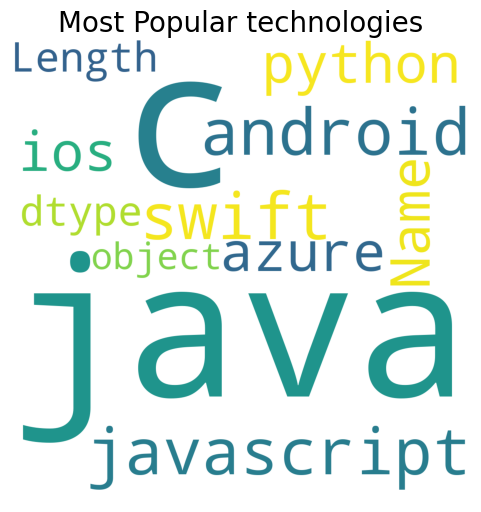

In [75]:
# wordcloud the most populat technologies(c,c#,c++ are all c , thats why I am useing the term technology)
from wordcloud import WordCloud, STOPWORDS


plt.rcParams['figure.figsize'] = (6, 6)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 121).generate(str(tags[0]))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular technologies',fontsize = 20)
plt.show()

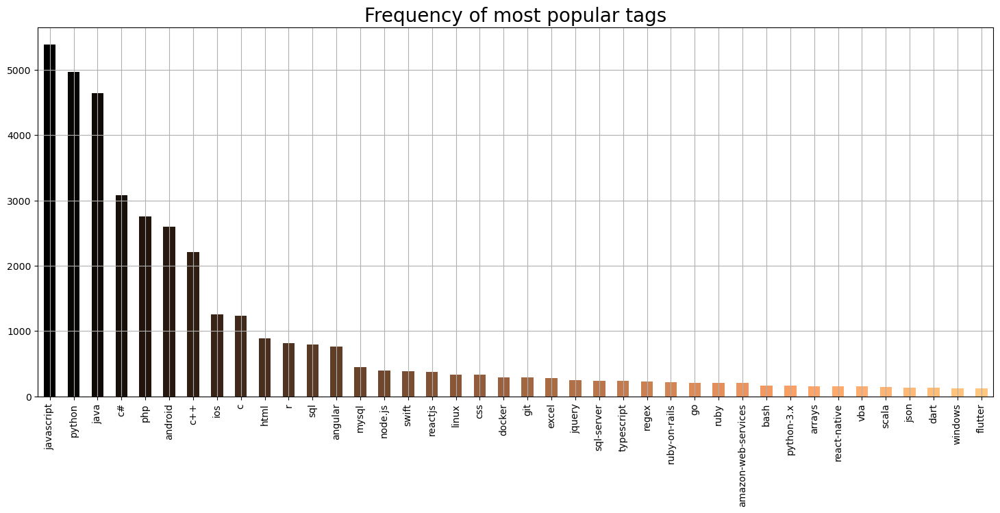

In [76]:
# looking at the frequency of most popular tags as the first tag

plt.rcParams['figure.figsize'] = (18, 7)
color = plt.cm.copper(np.linspace(0, 1, 40))
tags[0].value_counts().head(40).plot.bar(color = color)
plt.title('Frequency of most popular tags', fontsize = 20)
plt.xticks(rotation = 90 )
plt.grid()
plt.show()

## 2. Cleaning the text Data <a id="header22"></a>

- Let's look at the text of the body column:

In [77]:
# Text of Body

train['Body'][10]

'<p>I am new to Ubuntu (Linux tbh). I encountered problem with starting MongoDB service. I want to created web app using Ruby on Rails and MongoDB but mongo seems to fail to start.</p>\n\n<p>I followed this <a href="https://docs.mongodb.org/v3.0/tutorial/install-mongodb-on-ubuntu/">MongoDB installation on Ubuntu</a> all of installation went without problems until I got to <code>sudo service mongod start</code> </p>\n\n<p><strong>mongod.log</strong></p>\n\n<pre><code>2016-01-01T10:58:15.545+0000 I CONTROL  ***** SERVER RESTARTED *****\n2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] MongoDB starting : pid=3868 port=27017 dbpath=/var/lib/mongodb 64-bit host=damian-CX61-0NC-CX61-0ND-CX61-0NF-CX61-0NE\n2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] db version v3.0.8\n2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] git version: 83d8cc25e00e42856924d84e220fbe4a839e605d\n2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] build info: Linux ip-10-187-89-126 3.13.0-

- First let's clean the text of the body column:

In [78]:
# Clean the body column for test

test['Body'] = test['Body'].apply(lambda x:bsp(x,'html.parser').text.replace('\\','').replace('\n','').replace('\t','').replace('\r',''))

In [79]:
# Clean the body column for train

train['Body'] = train['Body'].apply(lambda x:bsp(x,'html.parser').text.replace('\\','').replace('\n','').replace('\t','').replace('\r',''))

- Now let's look how it looks now:

In [80]:
# Cleaned text

train['Body'][10]

'I am new to Ubuntu (Linux tbh). I encountered problem with starting MongoDB service. I want to created web app using Ruby on Rails and MongoDB but mongo seems to fail to start.I followed this MongoDB installation on Ubuntu all of installation went without problems until I got to sudo service mongod start mongod.log2016-01-01T10:58:15.545+0000 I CONTROL  ***** SERVER RESTARTED *****2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] MongoDB starting : pid=3868 port=27017 dbpath=/var/lib/mongodb 64-bit host=damian-CX61-0NC-CX61-0ND-CX61-0NF-CX61-0NE2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] db version v3.0.82016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] git version: 83d8cc25e00e42856924d84e220fbe4a839e605d2016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] build info: Linux ip-10-187-89-126 3.13.0-24-generic #46-Ubuntu SMP Thu Apr 10 19:11:08 UTC 2014 x86_64 BOOST_LIB_VERSION=1_492016-01-01T10:58:15.548+0000 I CONTROL  [initandlisten] allocator: tcmalloc201

- As we can see our text is perfectly cleaned and html tags and parsers are all eliminated.

- Now let's clean the title too:

In [81]:
# Clean the title column for test

test['Title'] = test['Title'].apply(lambda x:bsp(x,'html.parser').text.replace('\\','').replace('\n','').replace('\t','').replace('\r',''))

In [82]:
# Clean the title column for train

train['Title'] = train['Title'].apply(lambda x:bsp(x,'html.parser').text.replace('\\','').replace('\n','').replace('\t','').replace('\r',''))

- Let's eliminate date and time numbers for the html type of the text too:

In [83]:
# Clean the data
def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^(a-zA-Z)\s]','', text)
    return text
train['Body'] = train['Body'].apply(clean_text)
test['Body'] = test['Body'].apply(clean_text)

In [84]:
train['Title'] = train['Title'].apply(clean_text)
test['Title'] = test['Title'].apply(clean_text)

- This is how are body column looks like now:

In [85]:
train['Body'][10]

'i am new to ubuntu (linux tbh) i encountered problem with starting mongodb service i want to created web app using ruby on rails and mongodb but mongo seems to fail to starti followed this mongodb installation on ubuntu all of installation went without problems until i got to sudo service mongod start mongodlogt i control   server restarted t i control  initandlisten mongodb starting  pid port dbpathvarlibmongodb bit hostdamiancxnccxndcxnfcxnet i control  initandlisten db version vt i control  initandlisten git version dcceedefbeaedt i control  initandlisten build info linux ip generic ubuntu smp thu apr   utc  x boostlibversiont i control  initandlisten allocator tcmalloct i control  initandlisten options  config etcmongodconf net  bindip  port   storage  dbpath varlibmongodb journal  enabled true   systemlog  destination file logappend true path varlogmongodbmongodlog  t e network  initandlisten failed to unlink socket file tmpmongodbsock errno operation not permittedt i         ini

- Now that we know top 3 tags, Let's plot the words that most used in questions containing top 3 tags:

In [86]:
# Word Cloud without Stop words


def word_cloud(values):
    wordcloud = WordCloud(width = 500, height = 300, 
                background_color ='white', 
                min_font_size = 10).generate(values) 
    
    plt.figure(figsize=(19,9))

    plt.axis('off')
    plt.title("Without Stop Words")
    plt.imshow(wordcloud)
    plt.show()

- Wordcloud of words used in java, python and JavaScript tags:

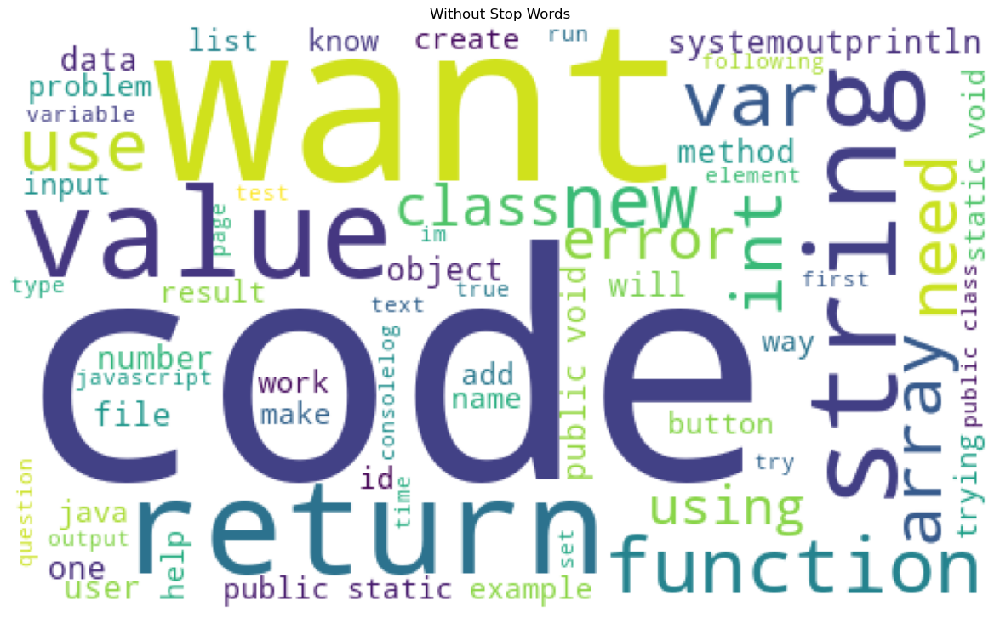

In [87]:
# Java Tag

Java = train[train['Tags'].str.contains('java')]['Body'].values

Java = ' '.join(list(Java))
word_cloud(Java)

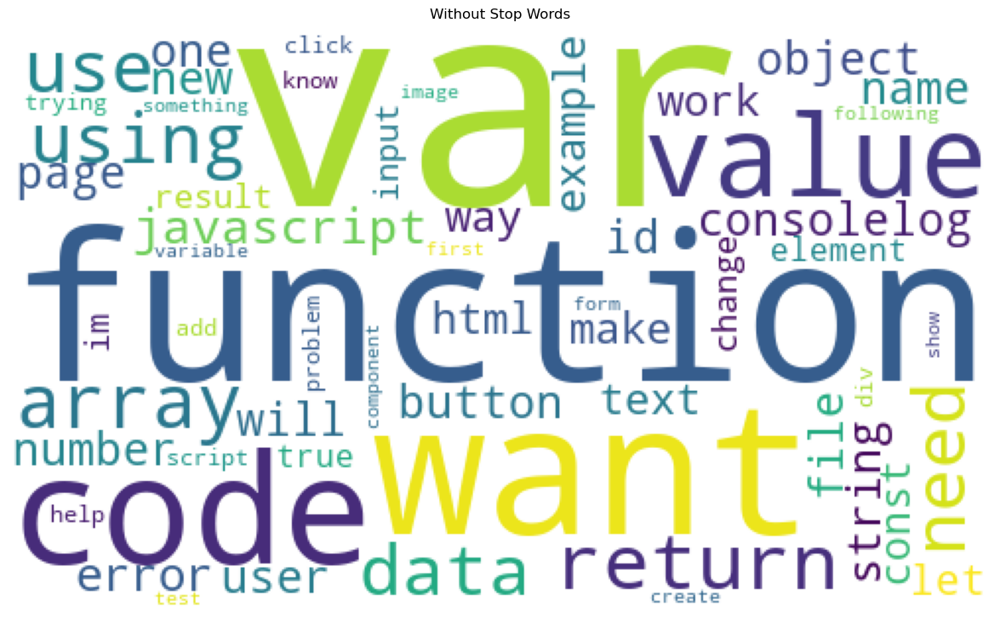

In [88]:
# JavaScript Tag

JavaScript = train[train['Tags'].str.contains('javascript')]['Body'].values

JavaScript = ' '.join(list(JavaScript))
word_cloud(JavaScript)

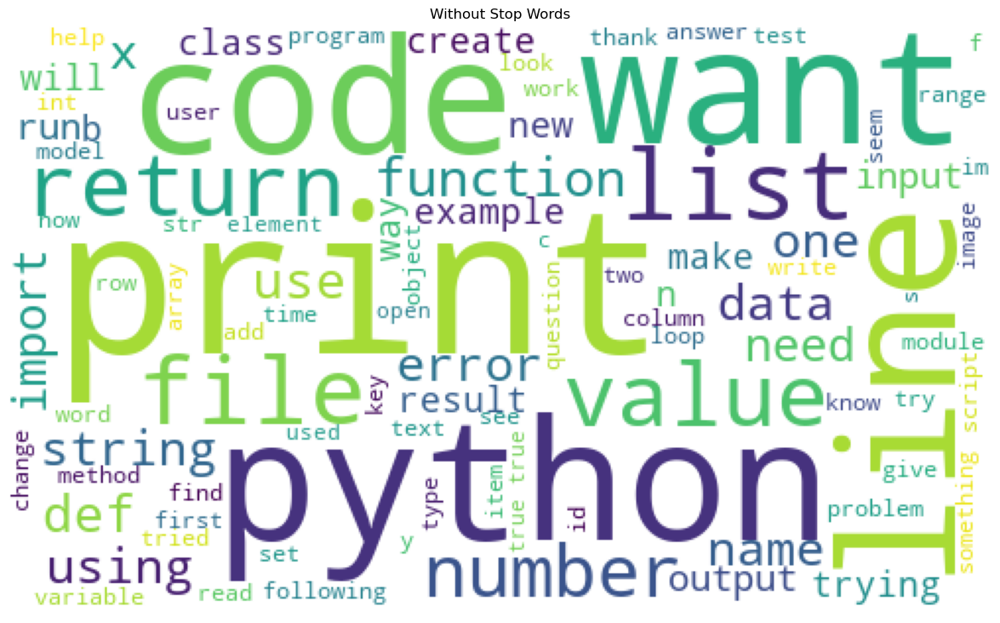

In [89]:
# Python Tag

Python = train[train['Tags'].str.contains('python')]['Body'].values

Python = ' '.join(list(Python))
word_cloud(Python)

We saw the distribution of words in questions related to the most 3 popular first tags(Java, JavaScript, Python). 

In [90]:
drop_col = ['Tags']

train.drop(columns=drop_col, inplace=True)
test.drop(columns=drop_col, inplace=True)

### Correlation Matrix:

- Let's see the correlation matrix for numerical columns:

<AxesSubplot:>

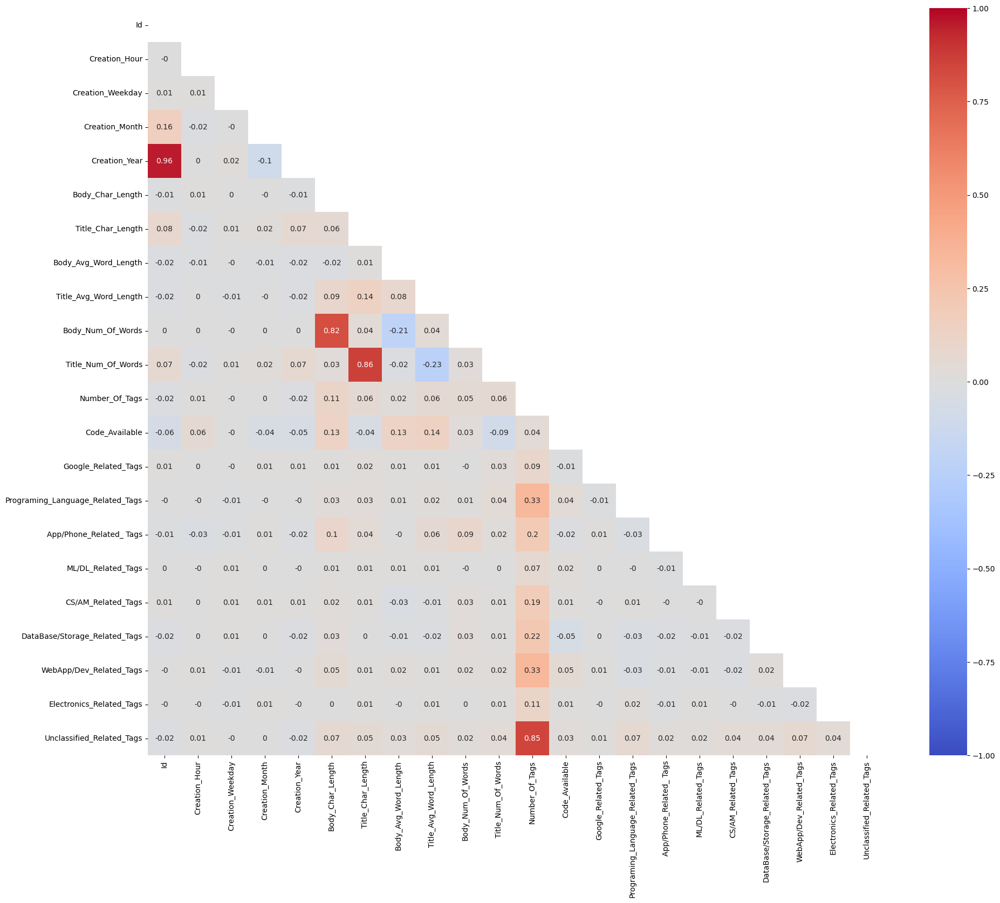

In [91]:
# Corr matrix

data = np.triu(train.corr())

plt.figure(figsize=(22, 18))
sns.heatmap(round(train.corr(),2), 
            annot = True,
            cmap = 'coolwarm', 
            vmin = -1, 
            vmax = 1,
            mask = data)

- We can see that there is high correlation between id and year column, and char and number of words columns for title and body and number of words with unclassified columns. So, let's drop them:

In [92]:
# Drop columns

drop_cols = ['Id','Title_Char_Length','Body_Char_Length','Unclassified_Related_Tags']

train.drop(columns=drop_cols, inplace=True)
test.drop(columns=drop_cols, inplace=True)

In [93]:
train.shape

(44997, 21)

In [94]:
test.shape

(15000, 21)

- Now we have 21 columns.

- Now let's change the target column to numerical columns:

Importnat note: Since in this project the important thing for us is to keeping or closing the question, I am going to conver LQ_EDIT column to HQ. So, in this dataset 1 means HQ questions and 0 means closed questions.

In [95]:
test['Y'] = test['Y'].map({'LQ_CLOSE':0, 'LQ_EDIT': 1, 'HQ':1})
train['Y'] = train['Y'].map({'LQ_CLOSE':0, 'LQ_EDIT': 1, 'HQ':1})

In [96]:
test['Y'].value_counts()

1    10000
0     5000
Name: Y, dtype: int64

In [97]:
train['Y'].value_counts()

1    29997
0    15000
Name: Y, dtype: int64

- By doing so, we can see that we have an imbalanced data. To avoid that and having the same portion of learning for both 0 and 1 categories, I am going to make a subset (sample) of my data.

## 3. Sampling (Subsetting) the data  <a id="header23"></a>

- Since the text length of our body column is so large, after vectorizing we will have too many columns and words and we will face MemorryError. Moreover, as we mentioned earlier I am going to subset my data to tackle the imbalance issue I mentioned earlier. To avoid these problems I am going to take a sample of the data:

To have equal distribution in sample data I will make a weight column and then we make our samples based on it:

In [98]:
# weight column to have a sample based on it for train

train['weights'] = train['Y'].map({1 : 1, 0: 2})

In [99]:
# train sample

train_sample = train.sample(frac = 0.5, weights='weights', random_state=17)
train_sample['Y'].value_counts(normalize=True)

1    0.557827
0    0.442173
Name: Y, dtype: float64

- Now I have a balanced data and we tackled the imbalance issue for our target column.

In [100]:
# weight column to have a sample based on it for test

test['weights'] = test['Y'].map({1 : 1, 0: 2})

In [101]:
# test sample

test_sample = test.sample(frac = 0.5, weights='weights', random_state=17)
test_sample['Y'].value_counts(normalize=True)

1    0.5616
0    0.4384
Name: Y, dtype: float64

In [102]:
#Drop the weight column which was introduced earlier

train_sample.drop(columns=['weights'], inplace=True)
test_sample.drop(columns=['weights'], inplace=True)

In [103]:
print(f"The train sample dataframe has {train_sample.shape[0]} rows and {train_sample.shape[1]} columns")
print(f"The test sample dataframe has {test_sample.shape[0]} rows and {test_sample.shape[1]} columns")

The train sample dataframe has 22498 rows and 21 columns
The test sample dataframe has 7500 rows and 21 columns


In [104]:
test_sample['Y'].value_counts()

1    4212
0    3288
Name: Y, dtype: int64

In [105]:
train_sample['Y'].value_counts()

1    12550
0     9948
Name: Y, dtype: int64

Now let's have a copy of our data to start vectorizing it and our modeling:

In [106]:
# copy

train_data = train_sample.copy()
test_data = test_sample.copy()

- Now we split remainder and test data:

In [107]:
# Split the train dataset into features and Target (rating)

X_remainder_sample = train_data.drop('Y', axis=1)
y_remainder_sample = pd.DataFrame(train_data['Y'])

# Split the test dataset into features and Target (rating)

X_test_sample = test_data.drop('Y', axis=1)
y_test_sample = pd.DataFrame(test_data['Y'])


# Part 3: Modeling & Model Optimizing <a id="pt3"></a>

## 1. TF-IDF Vectorizing <a id="header31"></a>

In [108]:
# Importing the TF-IDF library

from sklearn.feature_extraction.text import TfidfVectorizer

### Vectorizing body column:

- Creating temporary dataset:

In [109]:
#Creating temp dataset for remainder Body column

body_words_rem = pd.DataFrame(X_remainder_sample['Body'], index=X_remainder_sample.index)
body_words_rem

,Body
13497,so i have this page that can only be accessed ...
24395,i am trying to fetch date and time from event ...
8587,assuming i wanted to have a in a div picture o...
3147,i am trying to upload image by the below code ...
36236,so i was following a tutorial on medium tutori...
...,...
39582,i implement search in my application i try to ...
30851,in my recent project i need to union two dataf...
20770,i am building a deep nested form with angular ...
37155,i need to throw stdexeption if rad is negetive...


In [110]:
#Creating temp dataset for test body column

body_words_test = pd.DataFrame(X_test_sample['Body'], index=X_test_sample.index)
body_words_test

,Body
4485,i am trying to read gmail inbox using followin...
8130,im receiving this json from my server my requi...
2845,how can i modify the background of my html web...
1029,im trying to compile the below c code on fedor...
12077,i started trying to teach myself how to write ...
...,...
7062,i am creating a view as below design here plea...
10126,i am using the pima indian dataset and i am ge...
2456,i have forms form formi would like to freeze...
8669,im trying to copy an entire directory from my ...


- Vectorizing Body column:

In [111]:
# 1. Instantiate 
body_rem_tfidf = TfidfVectorizer(stop_words='english', min_df=15, max_features=1000)

# 2. Fit 
body_rem_tfidf.fit(body_words_rem['Body'])

# 3. Transform
body_rem_transformed = body_rem_tfidf.transform(body_words_rem['Body'])
body_test_transformed = body_rem_tfidf.transform(body_words_test['Body'])

In [112]:
body_rem_transformed

<22498x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 420229 stored elements in Compressed Sparse Row format>

In [113]:
body_test_transformed

<7500x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 139852 stored elements in Compressed Sparse Row format>

In [114]:
# Creating a dataframe from the vectorized sparse matrix
# Body column from X_remainder set

body_rem_df_tfidf = pd.DataFrame(body_rem_transformed.toarray(), columns= body_rem_tfidf.get_feature_names(), index=X_remainder_sample.index)
body_rem_df_tfidf

,ab,abc,able,accept,access,according,account,achieve,action,active,...,written,wrong,wrote,xcode,xml,year,yes,zero,zip,zygoteinitjava
13497,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.038518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,0.0,0.0,0.0,0.0,0.0,0.0,0.119562,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [115]:
#Checking the shape of the Body dataframe

print(f'There are {body_rem_df_tfidf.shape[0]} rows, and {body_rem_df_tfidf.shape[1]} columns in the X_remainder body dataframe')

There are 22498 rows, and 1000 columns in the X_remainder body dataframe


In [116]:
#Checking the number of rows is matching between the body df and the X_remainder

body_rem_df_tfidf.shape[0] == X_remainder_sample.shape[0]

True

- Now let's create one for test data:

In [117]:
# Creating a dataframe from the vectorized sparse matrix
# Body column from X_test set

body_test_df_tfidf = pd.DataFrame(body_test_transformed.toarray(), columns= body_rem_tfidf.get_feature_names(), index=X_test_sample.index)
body_test_df_tfidf

,ab,abc,able,accept,access,according,account,achieve,action,active,...,written,wrong,wrote,xcode,xml,year,yes,zero,zip,zygoteinitjava
4485,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.119983,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8130,0.000000,0.09319,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2845,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.302204,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1029,0.261317,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
12077,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.31041,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
10126,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2456,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8669,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.099083,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0


In [118]:
#Checking the shape of the body dataframe

print(f'There are {body_test_df_tfidf.shape[0]} rows, and {body_test_df_tfidf.shape[1]} columns in the X_test body dataframe')

There are 7500 rows, and 1000 columns in the X_test body dataframe


In [119]:
#Checking the number of rows is matching between the body df and the X_test

body_test_df_tfidf.shape[0] == X_test_sample.shape[0]

True

- Now, a prefix of `b_` will be added to the columns for both body dataframes. This will help with identifying the words vectorized from the body columns versus the title column, which will be done after this:

In [120]:
#Adding prefix to remainder body DF

body_rem_df_tfidf = body_rem_df_tfidf.add_prefix('b_')
body_rem_df_tfidf

,b_ab,b_abc,b_able,b_accept,b_access,b_according,b_account,b_achieve,b_action,b_active,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
13497,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.038518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,0.0,0.0,0.0,0.0,0.0,0.0,0.119562,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [121]:
#Adding prefix to test body DF

body_test_df_tfidf = body_test_df_tfidf.add_prefix('b_')
body_test_df_tfidf

,b_ab,b_abc,b_able,b_accept,b_access,b_according,b_account,b_achieve,b_action,b_active,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
4485,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.119983,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8130,0.000000,0.09319,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2845,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.302204,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1029,0.261317,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
12077,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.31041,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
10126,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2456,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8669,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.099083,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0


The Body dataframes have been updated with a column prefix of `b_` for all columns.

### Vectorizing title column:

- Creating temporary dataset:

In [122]:
#Creating temp dataset for remainder Title column

title_words_rem = pd.DataFrame(X_remainder_sample['Title'], index=X_remainder_sample.index)
title_words_rem

,Title
13497,redirect to log in page if session does not ex...
24395,error date and time in event viewer of window ...
8587,div positioning nested divs
3147,how to upload image by below code
36236,starting on hyperledger fabroc
...,...
39582,why does not the authorization occur
30851,union two dataframes of different types spark
20770,angular show all form group validation errors
37155,c exception throwing stdexception


In [123]:
#Creating temp dataset for test title column

title_words_test = pd.DataFrame(X_test_sample['Title'], index=X_test_sample.index)
title_words_test

,Title
4485,read gmail inbox using php
8130,unable to deserialize json to object using ret...
2845,website background texture
1029,below c code runs on fedora however on raspber...
12077,windows batch file to move files based on modi...
...,...
7062,how to create custom view in android
10126,key error but not sure why
2456,how do i freeze a form until an action has bee...
8669,copy entire directory from container to host


- Vectorizing Title column:

In [124]:
# 1. Instantiate 
title_rem_tfidf = TfidfVectorizer(stop_words='english', min_df=15, max_features=1000)

# 2. Fit 
title_rem_tfidf.fit(title_words_rem['Title'])

# 3. Transform
title_rem_transformed = title_rem_tfidf.transform(title_words_rem['Title'])
title_test_transformed = title_rem_tfidf.transform(title_words_test['Title'])

In [125]:
title_rem_transformed

<22498x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 83440 stored elements in Compressed Sparse Row format>

In [126]:
title_test_transformed

<7500x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 27250 stored elements in Compressed Sparse Row format>

In [127]:
# Creating a dataframe from the vectorized sparse matrix
# Title column from X_remainder set

title_rem_df_tfidf = pd.DataFrame(title_rem_transformed.toarray(), columns= title_rem_tfidf.get_feature_names(), index=X_remainder_sample.index)
title_rem_df_tfidf

,able,access,accessing,according,account,action,active,activity,adapter,add,...,write,writing,written,wrong,xamarin,xcode,xml,year,zero,zip
13497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [128]:
#Checking the shape of the Title dataframe

print(f'There are {title_rem_df_tfidf.shape[0]} rows, and {title_rem_df_tfidf.shape[1]} columns in the X_remainder title dataframe')

There are 22498 rows, and 1000 columns in the X_remainder title dataframe


In [129]:
#Checking the number of rows is matching between the title df and the X_remainder

title_rem_df_tfidf.shape[0] == X_remainder_sample.shape[0]

True

- Now let's create one for test data:

In [130]:
# Creating a dataframe from the vectorized sparse matrix
# title column from X_test set

title_test_df_tfidf = pd.DataFrame(title_test_transformed.toarray(), columns= title_rem_tfidf.get_feature_names(), index=X_test_sample.index)
title_test_df_tfidf

,able,access,accessing,according,account,action,active,activity,adapter,add,...,write,writing,written,wrong,xamarin,xcode,xml,year,zero,zip
4485,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2845,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1029,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12077,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10126,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2456,0.0,0.0,0.0,0.0,0.0,0.558966,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8669,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [131]:
#Checking the shape of the title dataframe

print(f'There are {title_test_df_tfidf.shape[0]} rows, and {title_test_df_tfidf.shape[1]} columns in the X_test title dataframe')

There are 7500 rows, and 1000 columns in the X_test title dataframe


In [132]:
#Checking the number of rows is matching between the title df and the X_test

title_test_df_tfidf.shape[0] == X_test_sample.shape[0]

True

- Now, a prefix of `t_` will be added to the columns for both title dataframes. This will help with identifying the words vectorized from the title columns versus the body column:

In [133]:
#Adding prefix to remainder title DF

title_rem_df_tfidf = title_rem_df_tfidf.add_prefix('t_')
title_rem_df_tfidf

,t_able,t_access,t_accessing,t_according,t_account,t_action,t_active,t_activity,t_adapter,t_add,...,t_write,t_writing,t_written,t_wrong,t_xamarin,t_xcode,t_xml,t_year,t_zero,t_zip
13497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [134]:
#Adding prefix to test title DF

title_test_df_tfidf = title_test_df_tfidf.add_prefix('t_')
title_test_df_tfidf

,t_able,t_access,t_accessing,t_according,t_account,t_action,t_active,t_activity,t_adapter,t_add,...,t_write,t_writing,t_written,t_wrong,t_xamarin,t_xcode,t_xml,t_year,t_zero,t_zip
4485,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2845,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1029,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12077,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10126,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2456,0.0,0.0,0.0,0.0,0.0,0.558966,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8669,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


The Title dataframes have been updated with a column prefix of `t_` for all columns.

### Combining TF-IDF vectorized body and title columns:

In [135]:
#Joining the two dataframes

comb_rem_df_tfidf = pd.concat([title_rem_df_tfidf, body_rem_df_tfidf], axis=1)
comb_rem_df_tfidf

,t_able,t_access,t_accessing,t_according,t_account,t_action,t_active,t_activity,t_adapter,t_add,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
13497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.038518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [136]:
len(comb_rem_df_tfidf) == len(X_remainder_sample)

True

### Combining vectorised columns with original X_remainder and X_test datasets

In [137]:
#Joining the combined dataframe with the original remainder dataset

X_remainder_vect_tfidf = pd.concat([X_remainder_sample, comb_rem_df_tfidf], axis=1)
X_remainder_vect_tfidf

,Title,Body,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
13497,redirect to log in page if session does not ex...,so i have this page that can only be accessed ...,18,3,11,2016,5.166667,5.000000,30,6,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,error date and time in event viewer of window ...,i am trying to fetch date and time from event ...,10,0,9,2017,4.888889,4.777778,18,9,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,div positioning nested divs,assuming i wanted to have a in a div picture o...,16,3,7,2016,7.000000,5.000000,27,5,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,how to upload image by below code,i am trying to upload image by the below code ...,9,4,3,2016,18.236842,5.000000,38,3,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,starting on hyperledger fabroc,so i was following a tutorial on medium tutori...,13,6,10,2018,15.800000,8.333333,25,3,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,why does not the authorization occur,i implement search in my application i try to ...,19,2,4,2019,3.613433,7.333333,670,3,...,0.0,0.038518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,union two dataframes of different types spark,in my recent project i need to union two dataf...,3,4,4,2018,4.865385,6.166667,104,6,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,angular show all form group validation errors,i am building a deep nested form with angular ...,13,1,5,2017,7.335260,6.166667,173,6,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,c exception throwing stdexception,i need to throw stdexeption if rad is negetive...,16,0,12,2018,3.928571,7.000000,42,5,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Sanity check to ensure the combined dataframe joined properly, and there was no loss in data:

In [138]:
#Checking number of rows are matching

print(X_remainder_sample.shape[0])
print(body_rem_df_tfidf.shape[0])
print(title_rem_df_tfidf.shape[0])

22498
22498
22498


In [139]:
X_remainder_sample.shape[0] == body_rem_df_tfidf.shape[0] == title_rem_df_tfidf.shape[0]

True

In [140]:
X_remainder_sample.shape[1] + body_rem_df_tfidf.shape[1] + title_rem_df_tfidf.shape[1]

2020

In [141]:
X_remainder_vect_tfidf.shape

(22498, 2020)

- Now that the body and title vectorized dataframes have been joined with the X_remainder_sample set, the original body and title columns can be dropped:

In [142]:
X_remainder_vect_tfidf.drop(columns=['Body', 'Title'], inplace= True)
X_remainder_vect_tfidf

,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,Number_Of_Tags,Code_Available,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
13497,18,3,11,2016,5.166667,5.000000,30,6,1,0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24395,10,0,9,2017,4.888889,4.777778,18,9,1,0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,16,3,7,2016,7.000000,5.000000,27,5,3,1,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3147,9,4,3,2016,18.236842,5.000000,38,3,2,0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36236,13,6,10,2018,15.800000,8.333333,25,3,3,0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39582,19,2,4,2019,3.613433,7.333333,670,3,3,0,...,0.0,0.038518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30851,3,4,4,2018,4.865385,6.166667,104,6,5,0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20770,13,1,5,2017,7.335260,6.166667,173,6,2,1,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37155,16,0,12,2018,3.928571,7.000000,42,5,3,1,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


- Now let's repeat above steps for our test dataset:

In [143]:
#Joining the two dataframes

comb_test_df_tfidf = pd.concat([title_test_df_tfidf, body_test_df_tfidf], axis=1)
comb_test_df_tfidf

,t_able,t_access,t_accessing,t_according,t_account,t_action,t_active,t_activity,t_adapter,t_add,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
4485,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.119983,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2845,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1029,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
12077,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.31041,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
10126,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2456,0.0,0.0,0.0,0.0,0.0,0.558966,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8669,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.099083,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0


In [144]:
#Joining the combined dataframe with the original test dataset

X_test_vect_tfidf = pd.concat([X_test_sample, comb_test_df_tfidf], axis=1)
X_test_vect_tfidf

,Title,Body,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
4485,read gmail inbox using php,i am trying to read gmail inbox using followin...,6,3,11,2016,2.763819,4.400000,398,5,...,0.0,0.119983,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8130,unable to deserialize json to object using ret...,im receiving this json from my server my requi...,11,0,9,2017,2.162712,6.666667,590,6,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2845,website background texture,how can i modify the background of my html web...,18,2,7,2016,10.071429,8.000000,28,3,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1029,below c code runs on fedora however on raspber...,im trying to compile the below c code on fedor...,5,3,3,2016,6.215247,5.727273,223,11,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
12077,windows batch file to move files based on modi...,i started trying to teach myself how to write ...,23,2,10,2018,5.925466,5.000000,161,10,...,0.0,0.000000,0.0,0.0,0.0,0.31041,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,how to create custom view in android,i am creating a view as below design here plea...,11,4,6,2017,12.210526,5.200000,19,5,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
10126,key error but not sure why,i am using the pima indian dataset and i am ge...,18,6,3,2018,13.283019,4.000000,53,4,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2456,how do i freeze a form until an action has bee...,i have forms form formi would like to freeze...,11,1,6,2016,6.555556,4.125000,18,8,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8669,copy entire directory from container to host,im trying to copy an entire directory from my ...,11,4,10,2017,9.675325,6.400000,77,5,...,0.0,0.099083,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0


In [145]:
#Checking number of rows are matching

print(X_test_sample.shape[0])
print(body_test_df_tfidf.shape[0])
print(title_test_df_tfidf.shape[0])

7500
7500
7500


In [146]:
X_test_sample.shape[1] + body_test_df_tfidf.shape[1] + title_test_df_tfidf.shape[1]

2020

In [147]:
X_test_sample.shape[0] == body_test_df_tfidf.shape[0] == title_test_df_tfidf.shape[0]

True

In [148]:
X_test_vect_tfidf.shape

(7500, 2020)

- Now that the body and title vectorized dataframes have been joined with the X_test_sample set, the original body and title columns can be dropped:

In [149]:
X_test_vect_tfidf.drop(columns=['Body', 'Title'], inplace= True)
X_test_vect_tfidf

,Creation_Hour,Creation_Weekday,Creation_Month,Creation_Year,Body_Avg_Word_Length,Title_Avg_Word_Length,Body_Num_Of_Words,Title_Num_Of_Words,Number_Of_Tags,Code_Available,...,b_written,b_wrong,b_wrote,b_xcode,b_xml,b_year,b_yes,b_zero,b_zip,b_zygoteinitjava
4485,6,3,11,2016,2.763819,4.400000,398,5,3,0,...,0.0,0.119983,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8130,11,0,9,2017,2.162712,6.666667,590,6,4,0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2845,18,2,7,2016,10.071429,8.000000,28,3,3,0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1029,5,3,3,2016,6.215247,5.727273,223,11,5,1,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
12077,23,2,10,2018,5.925466,5.000000,161,10,2,0,...,0.0,0.000000,0.0,0.0,0.0,0.31041,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7062,11,4,6,2017,12.210526,5.200000,19,5,2,0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
10126,18,6,3,2018,13.283019,4.000000,53,4,1,1,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2456,11,1,6,2016,6.555556,4.125000,18,8,3,0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
8669,11,4,10,2017,9.675325,6.400000,77,5,3,1,...,0.0,0.099083,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0


- Let's check the data types of our columns:

In [150]:
X_test_vect_tfidf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7500 entries, 4485 to 11870
Columns: 2018 entries, Creation_Hour to b_zygoteinitjava
dtypes: float64(2002), int64(16)
memory usage: 115.5 MB


In [151]:
X_remainder_vect_tfidf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22498 entries, 13497 to 36781
Columns: 2018 entries, Creation_Hour to b_zygoteinitjava
dtypes: float64(2002), int64(16)
memory usage: 346.6 MB


Great! Now the dataset is ready for the modeling.

## 2. Baseline Models <a id="header32"></a>

### Logistic Regression

Before fitting the model the combined TF-IDF vectorized dataframes created earlier need to be scaled:

I am going to use minmax scaler because most of my data is consisted of binary columns:

In [152]:
# Import LogisticRegression library
from sklearn.linear_model import LogisticRegression

# Import the scalers
from sklearn.preprocessing import MinMaxScaler

# StandardScaler will be used
scaler = MinMaxScaler()

In [153]:
scaler.fit(X_remainder_vect_tfidf)

MinMaxScaler()

In [154]:
X_remainder_tfidf_scaled = scaler.transform(X_remainder_vect_tfidf)
X_test_tfidf_scaled = scaler.transform(X_test_vect_tfidf)

Now let's start the modeling phase:

In [155]:
# 1. Instantiate model
base_logit_tfidf = LogisticRegression(random_state=17)

#2. Fit model
base_logit_tfidf.fit(X_remainder_tfidf_scaled, y_remainder_sample)

# 3. Score model
print(f'Score on remainder: {base_logit_tfidf.score(X_remainder_tfidf_scaled, y_remainder_sample)}')
print(f'Score on test: {base_logit_tfidf.score(X_test_tfidf_scaled, y_test_sample)}')

Score on remainder: 0.799893323851009
Score on test: 0.7470666666666667


- 74.7% is my score for my baseline model.

### Logistic Regression Coefficients:

In [156]:
#Column names will be taken from the X_remainder dataset
reg_coefs_tfidf = pd.DataFrame(data= base_logit_tfidf.coef_, columns=X_remainder_vect_tfidf.columns).T

#Setting the index to be the column names
reg_coefs_tfidf = reg_coefs_tfidf.set_index(X_remainder_vect_tfidf.columns)

#Sorting the values in descending order of coefficients
reg_coefs_tfidf.sort_values(by=0, ascending=False, inplace=True)

#Making the index which was has the column/feature names into its own column
reg_coefs_tfidf = reg_coefs_tfidf.rename_axis('Features').reset_index().rename(columns={0:'Regression Coefficients'})

In [157]:
#Lets take a look at the new regression coefficients dataframe created

reg_coefs_tfidf.head()

,Features,Regression Coefficients
0,Title_Avg_Word_Length,5.008253
1,t_flutter,3.942590
2,b_docs,3.492100
3,t_kotlin,3.375201
4,t_pandas,2.679524


In [158]:
reg_coefs_tfidf.tail()

,Features,Regression Coefficients
2013,Code_Available,-1.957605
2014,t_software,-1.974270
2015,t_terminal,-2.069329
2016,t_nullpointerexception,-2.117965
2017,t_best,-2.560848


The dataframe looks like it has loaded properly, and is in the correct descending order of Coefficients.

Now the dataframe for the b_(body words) will be created:

In [159]:
body_words_tfidf = reg_coefs_tfidf[reg_coefs_tfidf['Features'].str.contains('b_')]
body_words_tfidf.head(20) #20 words most predictive of a spam review

,Features,Regression Coefficients
2,b_docs,3.492100
6,b_docker,2.590000
8,b_documentation,2.539577
9,b_import,2.438537
14,b_logs,2.311472
15,b_component,2.262598
17,b_version,2.160010
18,b_warning,2.125302
21,b_configure,2.090400
22,b_description,2.089001


Now the dataframe for the t_(title words) will be created:

In [160]:
title_words_tfidf = reg_coefs_tfidf[reg_coefs_tfidf['Features'].str.contains('t_')]
title_words_tfidf.head(20) #20 words most predictive of a spam review

,Features,Regression Coefficients
1,t_flutter,3.942590
3,t_kotlin,3.375201
4,t_pandas,2.679524
5,t_tensorflow,2.636330
7,t_vuejs,2.579916
11,t_swiftui,2.387812
12,t_typescript,2.385529
13,t_kubernetes,2.360147
16,t_core,2.184874
19,t_angular,2.110106


These are the 20 words most predictive of a HQ (not closed) question.

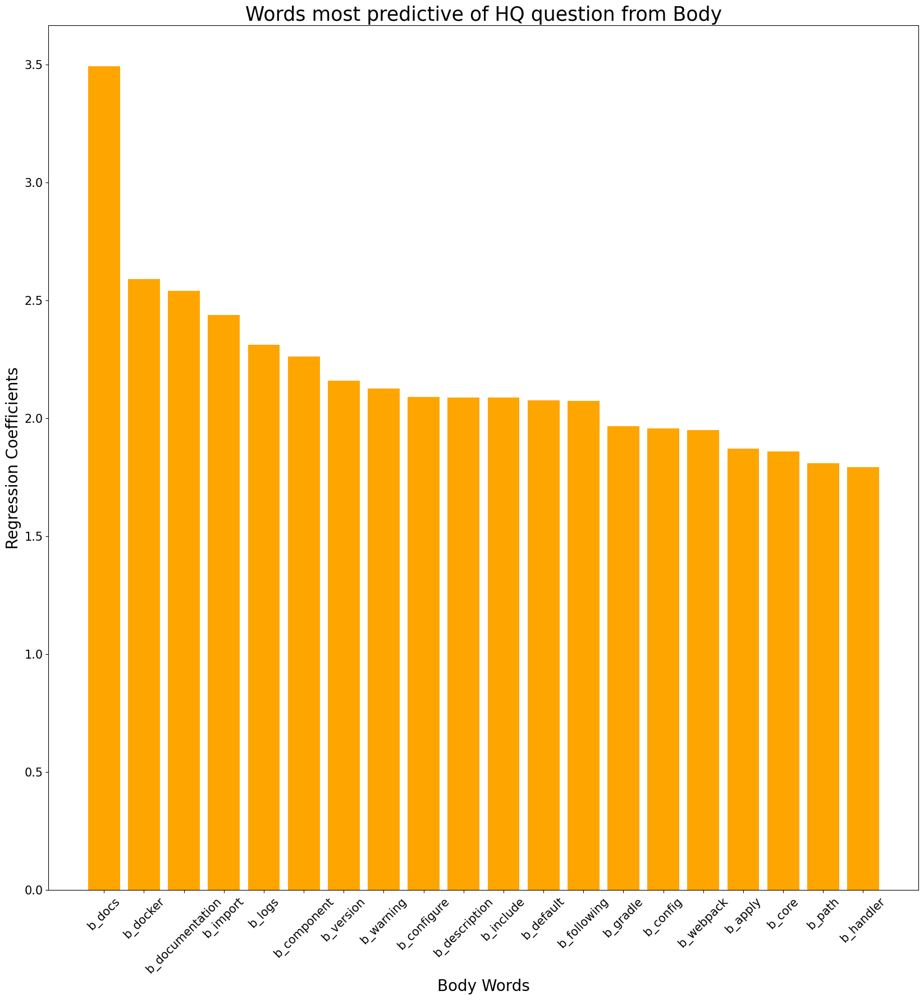

In [161]:
#20 words most predictive of HQ question from body text

plt.figure(figsize=(20,20))
plt.bar(body_words_tfidf['Features'].head(20), body_words_tfidf['Regression Coefficients'].head(20), color='orange')
plt.xlabel('Body Words', fontsize=20)
plt.xticks(fontsize=15, rotation = 45)
plt.ylabel('Regression Coefficients', fontsize=20)
plt.yticks(fontsize=15)
plt.title('Words most predictive of HQ question from Body', fontsize=25)
plt.show()

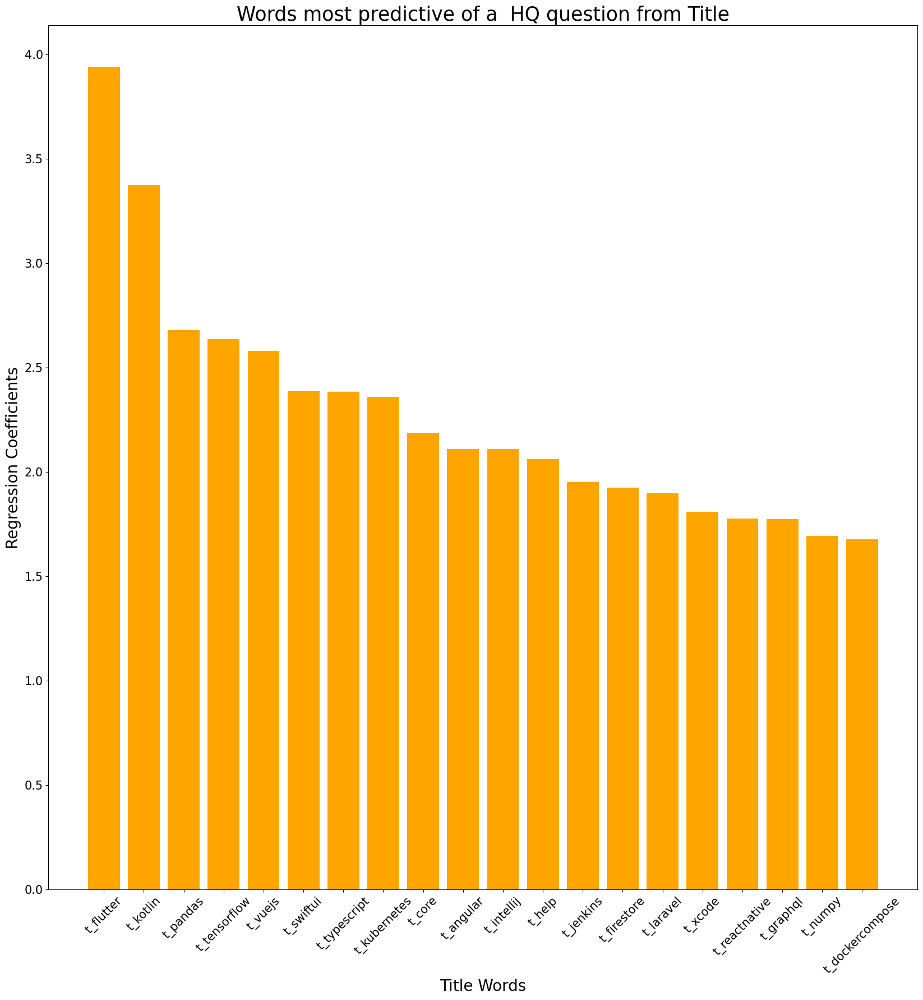

In [162]:
#20 words most predictive of a High Quality question from title

plt.figure(figsize=(20,20))
plt.bar(title_words_tfidf['Features'].head(20), title_words_tfidf['Regression Coefficients'].head(20), color='orange')
plt.xlabel('Title Words', fontsize=20)
plt.xticks(fontsize=15, rotation = 45)
plt.ylabel('Regression Coefficients', fontsize=20)
plt.yticks(fontsize=15)
plt.title('Words most predictive of a  HQ question from Title', fontsize=25)
plt.show()

- Here we can see that our most predictive words for high quality questions for the title are advance and technical words for different branches of programming community.


Now let's plot the words indicated in closed question:

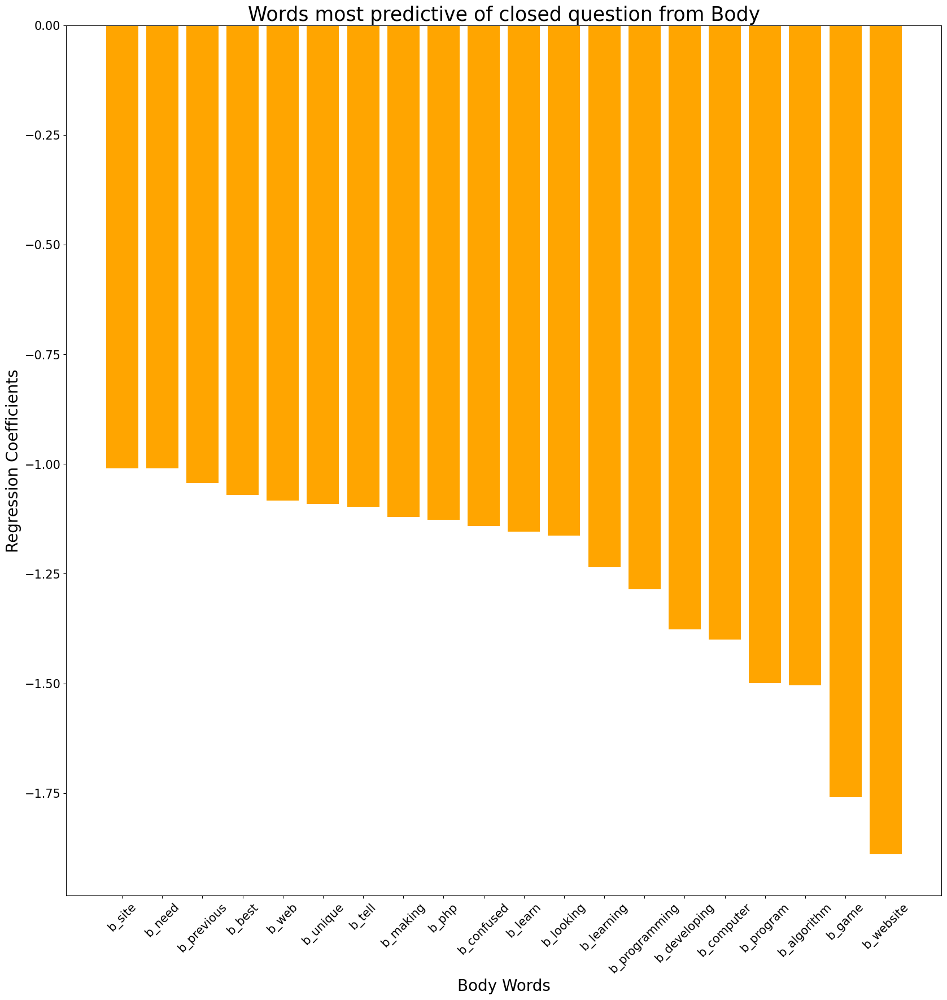

In [163]:
#20 words most predictive of closed question from body text

plt.figure(figsize=(20,20))
plt.bar(body_words_tfidf['Features'].tail(20), body_words_tfidf['Regression Coefficients'].tail(20), color='orange')
plt.xlabel('Body Words', fontsize=20)
plt.xticks(fontsize=15, rotation = 45)
plt.ylabel('Regression Coefficients', fontsize=20)
plt.yticks(fontsize=15)
plt.title('Words most predictive of closed question from Body', fontsize=25)
plt.show()

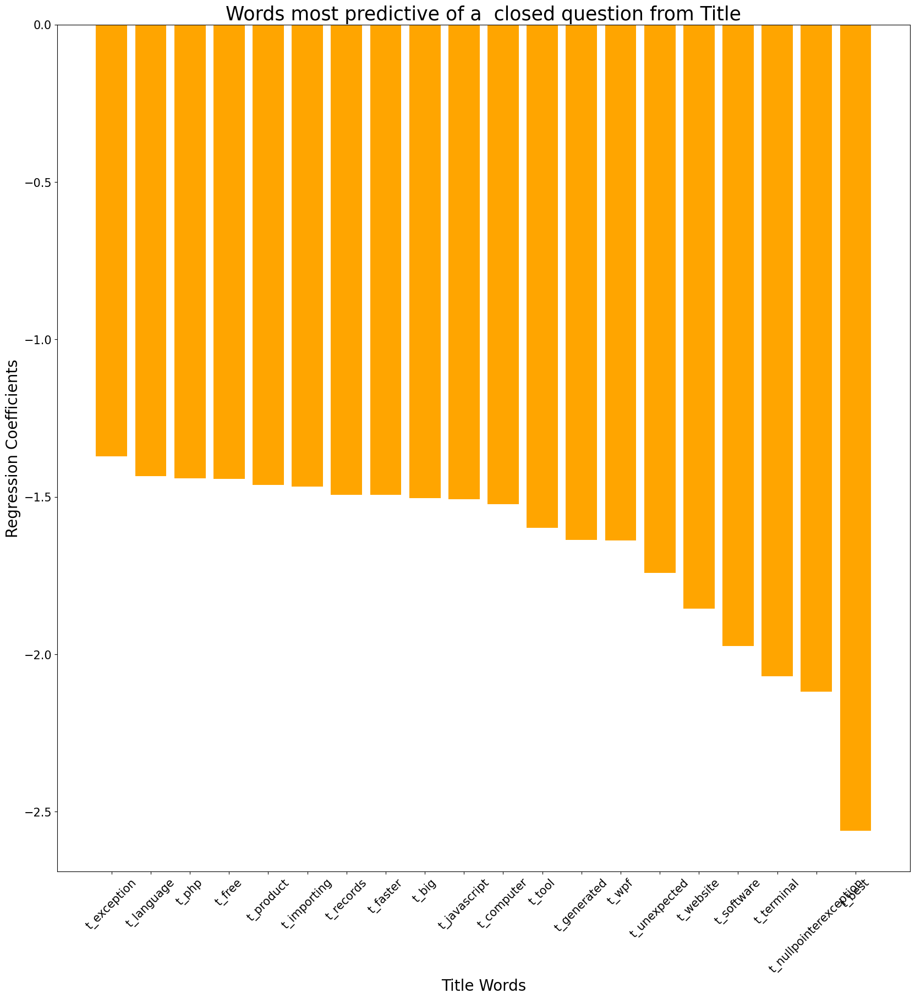

In [164]:
#20 words most predictive of a closed question from title

plt.figure(figsize=(20,20))
plt.bar(title_words_tfidf['Features'].tail(20), title_words_tfidf['Regression Coefficients'].tail(20), color='orange')
plt.xlabel('Title Words', fontsize=20)
plt.xticks(fontsize=15, rotation = 45)
plt.ylabel('Regression Coefficients', fontsize=20)
plt.yticks(fontsize=15)
plt.title('Words most predictive of a  closed question from Title', fontsize=25)
plt.show()

- Here we can see that top 20 titles for closed questions are general words comparing to technical and advanced words for HQ questions predictive words.
- Some overlap words for both title and body:
 - website
 - computer
 - best
- 2 programming languages are among titles here: php and javascript.
- php both can be seen in body and title columns.
- It is interesting that javascript and php titles are among top 20 most predictive words for closed questions. The reason maybe because of the high number of questions related to javascript, so there would be higher chance of creating low quality questions too.

### Confusion Matrix for the LogisticRegression on the TF-IDF Combined Vectorized dataset

In [165]:
#Import the confusion matrix libraries
from sklearn.metrics import plot_confusion_matrix, confusion_matrix

# Get class predictions
y_pred = base_logit_tfidf.predict(X_test_tfidf_scaled)

# Generate confusion matrix
cf_matrix = confusion_matrix(y_test_sample, y_pred)

# label rows and columns
cf_df = pd.DataFrame(
    cf_matrix, 
    columns=["Predicted Close questions", "Predicted HQ questions"],
    index=["True Close questions", "True HQ questions"]
)

display(cf_df)

,Predicted Close questions,Predicted HQ questions
True Close questions,2246,1042
True HQ questions,855,3357


Text(0.5, 1.0, 'TF-IDF LogReg Confusion Matrix')

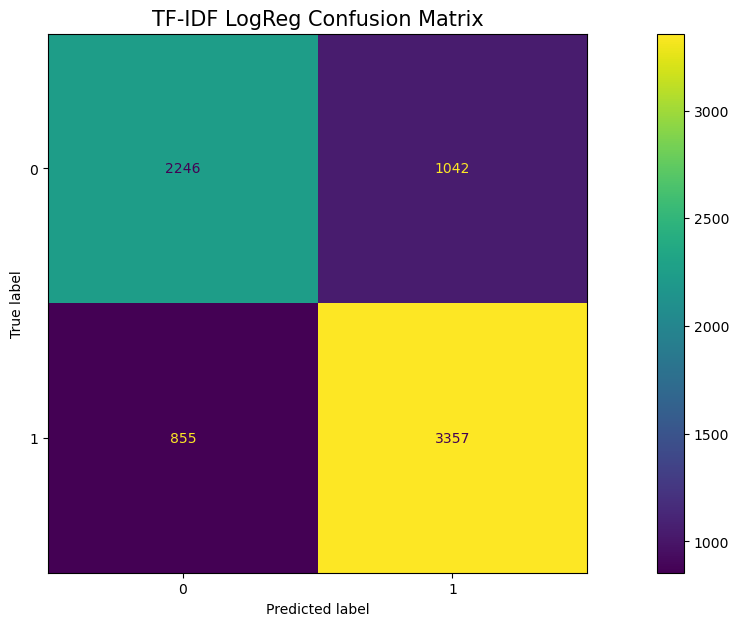

In [166]:
# the function expects the estimator, inputs and target as parameters
plot_confusion_matrix(base_logit_tfidf, X_test_tfidf_scaled, y_test_sample)
plt.grid(False)
plt.title('TF-IDF LogReg Confusion Matrix', fontsize=15)

In [167]:
#Importing the classification report library
from sklearn.metrics import classification_report

#Now the classification report can be generated
report_initial = classification_report(y_test_sample, y_pred)
print(report_initial)

              precision    recall  f1-score   support

           0       0.72      0.68      0.70      3288
           1       0.76      0.80      0.78      4212

    accuracy                           0.75      7500
   macro avg       0.74      0.74      0.74      7500
weighted avg       0.75      0.75      0.75      7500



As predicted we have a accuracy of 75%, and a decent recall rate of 68% for closed questions and 80% for high quality questions.

The difference between the True Positive and False Positive rates might be due to a class imbalance in the dataset.

We can try to improve the recall rate by adjusting the y_proba threshold.

Lets take a look at how much the recall would improve if we adjusted the y_proba rate to 0.2 from the default value of 0.5:

In [168]:
# Importing precision and recall score libraries
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# Make probabilistic predictions (scores)
y_proba = base_logit_tfidf.predict_proba(X_test_tfidf_scaled)[:,1]

# First calculate precision and recall using the default (0.5) cut-off
y_threshold = np.where(y_proba > 0.5, 1, 0)
print("Threshold of 0.5:")
print(f"Precision score: {precision_score(y_test_sample, y_threshold)}")
print(f"Recall score: {recall_score(y_test_sample, y_threshold)}")
print("")

# Calculate the same using a much lower cut-off (0.2)
y_threshold = np.where(y_proba > 0.2, 1, 0)
print("Threshold of 0.2:")
print(f"Precision score: {precision_score(y_test_sample, y_threshold)}")
print(f"Recall score: {recall_score(y_test_sample, y_threshold)}")

Threshold of 0.5:
Precision score: 0.7631279836326438
Recall score: 0.7970085470085471

Threshold of 0.2:
Precision score: 0.6427224143351148
Recall score: 0.9707977207977208


So by reducing our y_proba threshold from 0.5 to 0.2, we are seeing a 18% increase in the recall, but we also have a 12% drop in the accuracy.

### PCA 

- PCA will be conducted on the scaled remainder dataset.

In [169]:
#Import the PCA Library
from sklearn.decomposition import PCA

#For the first run we will not define the n_components hyperparameter
# Instantiate the model 
TFIDF_PCA = PCA()

# Fit the PCA object to the data
TFIDF_PCA.fit(X_remainder_tfidf_scaled)

X_rem_TF_PCA = TFIDF_PCA.transform(X_remainder_tfidf_scaled)
X_test_TF_PCA = TFIDF_PCA.transform(X_test_tfidf_scaled)

In [170]:
#Checking the shape of the PCA Remainder data

print(X_rem_TF_PCA.shape)

(22498, 2018)


Lets check the two key attributes from the fitted PCS:
1. explained_variance_ : Array containing the amount of variance explained by each component.
2. explained_variance_ratio : Array containing the percentage of variance explained by each component.

In [171]:
# Checking the variances for the TF-IDF PCA Model
for i in range(5):
    print(f"Variance captured by the TF-IDF PC{i}: {TFIDF_PCA.explained_variance_[i]: 0.3f}")

for i in range(5):
    print(f"Proportion of variance captured by the TF-IDF PC{i}: {TFIDF_PCA.explained_variance_ratio_[i]: 0.3f}")

Variance captured by the TF-IDF PC0:  0.252
Variance captured by the TF-IDF PC1:  0.103
Variance captured by the TF-IDF PC2:  0.099
Variance captured by the TF-IDF PC3:  0.096
Variance captured by the TF-IDF PC4:  0.077
Proportion of variance captured by the TF-IDF PC0:  0.074
Proportion of variance captured by the TF-IDF PC1:  0.030
Proportion of variance captured by the TF-IDF PC2:  0.029
Proportion of variance captured by the TF-IDF PC3:  0.028
Proportion of variance captured by the TF-IDF PC4:  0.023


 - PC0 had the highest variance capture of 0.252. The TF-IDF PC0 had a 0.15 higher variance capture which is quite significant since this is only a sample of the first 5 PC's out of the potential ~2000.
 - For the explained variance ratio, it looks like PC0 value is 0.074. What is interesting to see here is that there is a sharp drop in the ratios from PC0 to PC1, a 0.44 total drop. However, from PC1 to PC4 the difference is not alot. This indicates that the TF-IDF model, besides PC0, has a balanced dataset with regards to the variance capture among all other PC's.

Lets now find the optimal number of PC's:

### Optimal number of Principal Components

For finding the optimal number of Principal Components, we will use the method of pre-setting our proportion of variance explained to 90%

In [172]:
# Pull out the explained variance ratio for the TF-IDF PCA Model
TF_expl_var = TFIDF_PCA.explained_variance_ratio_

# Calculate the cumulative sum of this array using the 
TF_var_sum = np.cumsum(TF_expl_var)

TF_var_sum

array([0.07412531, 0.1043062 , 0.13335497, ..., 0.99995247, 0.99998065,
       1.        ])

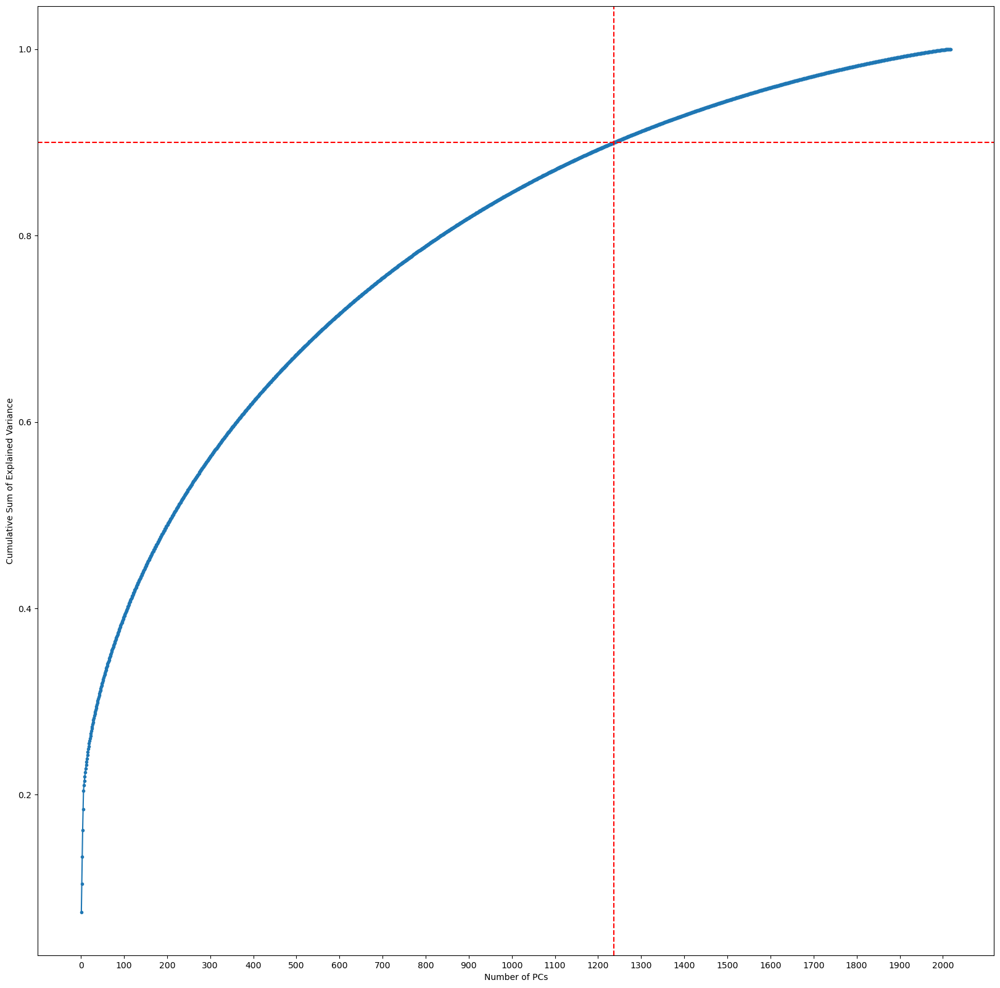

In [173]:
# Plot out the cumulative sum graph for the TF-IDF PCA Model

plt.figure(figsize=(20,20))
plt.plot(range(1,2019), TF_var_sum, marker='.')
plt.axhline(0.9, c='r', linestyle='--')
plt.axvline(1237, c='r', linestyle='--')
plt.xlabel('Number of PCs')
plt.ylabel('Cumulative Sum of Explained Variance')
plt.xticks(range(0,2100,100))
plt.show()

- optimal number of components:

In [174]:
# optimal number of components

print(f'Optimal number of components based on the TF-IDF Vectorized Data is {np.argmax(TF_var_sum > 0.9)}')

Optimal number of components based on the TF-IDF Vectorized Data is 1237


- Let's instantiate the model again with our optimal number of component:

In [175]:
# Instantiate the model
base_PCA = PCA(n_components=1237)

# Fit the PCA object to the data
base_PCA.fit(X_remainder_tfidf_scaled)

# Transform the original data. This applies the 'change of basis' that transforms the data to be based on the principal components
X_remainder_PCA = base_PCA.transform(X_remainder_tfidf_scaled)
X_test_PCA = base_PCA.transform(X_test_tfidf_scaled)

In [176]:
#Lets compare the shapes of the PCA Transformed vs. Original Remainder dataset

print(f'Original: {X_remainder_tfidf_scaled.shape}')
print(f'PCA Transformed: {X_remainder_PCA.shape}')

Original: (22498, 2018)
PCA Transformed: (22498, 1237)


he PCA transformation has reduced the column dimensionality by 781 columns. The columns have been reduced from 2018 to 1237.

As a sanity check to ensure that 1237 is the optimal number of PCs, we will use the shortcut for this method:

In [177]:
# Instantiate the model
base_PCA = PCA(n_components=0.9)

# Fit the PCA object to the data
base_PCA.fit(X_remainder_tfidf_scaled)

# Transform the original data. This applies the 'change of basis' that transforms the data to be based on the principal components
X_remainder_PCA = base_PCA.transform(X_remainder_tfidf_scaled)
X_test_PCA = base_PCA.transform(X_test_tfidf_scaled)

In [178]:
#Lets compare the shapes of the PCA Transformed vs. Original Remainder dataset

print(f'Original: {X_remainder_tfidf_scaled.shape}')
print(f'PCA Transformed: {X_remainder_PCA.shape}')

Original: (22498, 2018)
PCA Transformed: (22498, 1238)


- Nice! we have almost the same number.

- Now let's fit the logistic regression model and compare the results:

In [179]:
#Instantiate the model with PCA datasets
base_logit_PCA = LogisticRegression()

# Fitting to PCA data
base_logit_PCA.fit(X_remainder_PCA, y_remainder_sample)


LogisticRegression()

In [180]:
# Scoring on PCA train and test sets

print(f'Train Score: {base_logit_PCA.score(X_remainder_PCA, y_remainder_sample)}')
print(f'Test Score: {base_logit_PCA.score(X_test_PCA, y_test_sample)}')


Train Score: 0.7833585207574006
Test Score: 0.7477333333333334


In [181]:
print(f'Score on remainder: {base_logit_tfidf.score(X_remainder_tfidf_scaled, y_remainder_sample)}')
print(f'Score on test: {base_logit_tfidf.score(X_test_tfidf_scaled, y_test_sample)}')

Score on remainder: 0.799893323851009
Score on test: 0.7470666666666667


- The results of the PCA model and Base model are almost the same.

Since there is no significant improvement in the results of the PCA model. I shall not be using dimension reducers when I move onto advanced modelling for running a ML Pipeline with GridSearch for finding the best model with optimal hyperparameters.

## 3. Model Optimization <a id="header33"></a>

The following models will be run, and certain hyperparameters for each model will be manually optimized.
The models that will be run for optimization are:
1. LogisticRegression
2. SVM (Support Vector Machines)
3. Random Forrest (Decision Trees)
4. XGBoost

For all of these models, I shall be using the Scaled TF-IDF Vectorized data..

General Procedure for HyperParameter optimization:
1. Identify the hyperparameter to be manually optimized
2. Create a range for the hyperparameter
3. Create empty lists for storing the accuracy results for each hyperparameter range value
4. Create for loop to Instantiate and fit the model to the X_remainder_vect_tfidf, y_remainder datasets, and append the empty accuracy lists
5. Create a dataframe of the accuracy results and plot to identify the optimal value for the hyperparameter
6. Re-run and score the model using the optimal value found for the hyperparameter

Lets start with optimizing the c_value for the LogisticRegression model:

### LogisticRegression Optimization

In [182]:
# Let's try this range of C values
c_values = [.00001, .0001, .001, 0.01, .1, 1, 10, 100, 1000, 10000]

# Create empty lists for storing the accuracy results of each C value
remainder_accuracies = []
test_accuracies = []

# Iterate over the C values
for value in c_values:
    print(f"Working on c={value}...", end="\r")
    
    # Instantiate a log reg and fit to the remainder set
    logreg = LogisticRegression(C=value, random_state=17).fit(X_remainder_tfidf_scaled, y_remainder_sample)
    
    # Score on the remainder set and append this accuracy to its respective list
    remainder_accuracies.append(logreg.score(X_remainder_tfidf_scaled, y_remainder_sample))
    
    # Score on the test set and append this accuracy to its respective list
    test_accuracies.append(logreg.score(X_test_tfidf_scaled, y_test_sample))

In [183]:
# Check the accuracies

pd.DataFrame({'C value': c_values, 'remainder accuracy': remainder_accuracies, 'test accuracy': test_accuracies})

,C value,remainder accuracy,test accuracy
0,0.00001,0.557827,0.561600
1,0.00010,0.557827,0.561600
2,0.00100,0.682861,0.681200
3,0.01000,0.721531,0.710933
4,0.10000,0.773091,0.750667
5,1.00000,0.799893,0.747067
6,10.00000,0.801716,0.743333
7,100.00000,0.802427,0.741867
8,1000.00000,0.802071,0.741733
9,10000.00000,0.802116,0.741733


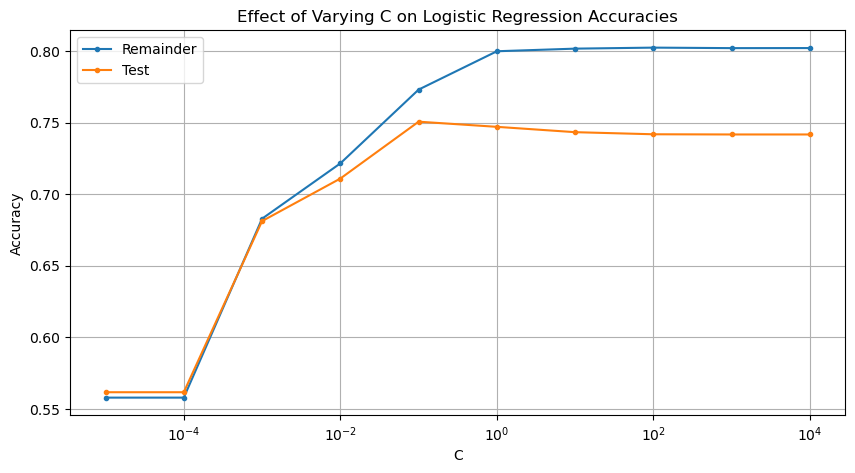

In [184]:
# Plot the accuracies
plt.figure(figsize=(10, 5))
plt.plot(c_values, remainder_accuracies, label='Remainder', marker='.')
plt.plot(c_values, test_accuracies, label='Test', marker='.')
plt.legend()
plt.title('Effect of Varying C on Logistic Regression Accuracies')
plt.xscale('log') # Put the x-axis on a log scale; this is important because the C values vary in orders of magnitude
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

Based on the plot above, a C_value of 0.1 seems to be giving the best result, where the remainder and test accuracies are relatively close. It can also be seen that a C_value greater than 0.1, Test accuracy starts dropping. 

Lets re-run the LogisticRegression with a C_value of 0.1 and check the accuracies:


In [185]:
# Instantiate a log reg and fit to the remainder set
logreg = LogisticRegression(C=0.1, random_state=17).fit(X_remainder_tfidf_scaled, y_remainder_sample)
    
# Score on the model
print(f'LogisticRegression accuracy on the remainder set with a C_value of 0.1 is {round(logreg.score(X_remainder_tfidf_scaled, y_remainder_sample)*100, 2)}%')
print(f'LogisticRegression accuracy on the test set with a C_value of 0.1 is {round(logreg.score(X_test_tfidf_scaled, y_test_sample)*100, 2)}%')

LogisticRegression accuracy on the remainder set with a C_value of 0.1 is 77.31%
LogisticRegression accuracy on the test set with a C_value of 0.1 is 75.07%


With a C_value of 0.1 we got a 77.31% accuracy on the remainder set, and an 75.07% accuracy on the test. Further optimizations will be done via a ML Pipeline with a GridSearch.

### SVM Optimization

The C_value optimization will follow the exact same procedure as the LogisticRegression optimization above:

In [186]:
from sklearn.svm import LinearSVC

# Let's try this range of C values
c_values = [.00001, .0001, .001, 0.01, .1, 1, 10, 100, 1000, 10000]

# Create empty lists for storing the accuracy results of each C value
remainder_accuracies = []
test_accuracies = []

# Iterate over the C values
for value in c_values:
    print(f"Working on c={value}...", end="\r")
    
    # Instantiate a Linear SVC and fit to the remainder set
    lin_svm = LinearSVC(C=value, random_state=17).fit(X_remainder_tfidf_scaled, y_remainder_sample)
    
    # Score on the remainder set and append this accuracy to its respective list
    remainder_accuracies.append(lin_svm.score(X_remainder_tfidf_scaled, y_remainder_sample))
    
    # Score on the test set and append this accuracy to its respective list
    test_accuracies.append(lin_svm.score(X_test_tfidf_scaled, y_test_sample))

In [187]:
# Check the accuracies

pd.DataFrame({'C value': c_values, 'remainder accuracy': remainder_accuracies, 'test accuracy': test_accuracies})

,C value,remainder accuracy,test accuracy
0,0.00001,0.557872,0.561600
1,0.00010,0.671393,0.668667
2,0.00100,0.715975,0.708000
3,0.01000,0.771402,0.752400
4,0.10000,0.799716,0.748800
5,1.00000,0.800916,0.742267
6,10.00000,0.800960,0.742133
7,100.00000,0.779936,0.724667
8,1000.00000,0.702418,0.661067
9,10000.00000,0.728198,0.687867


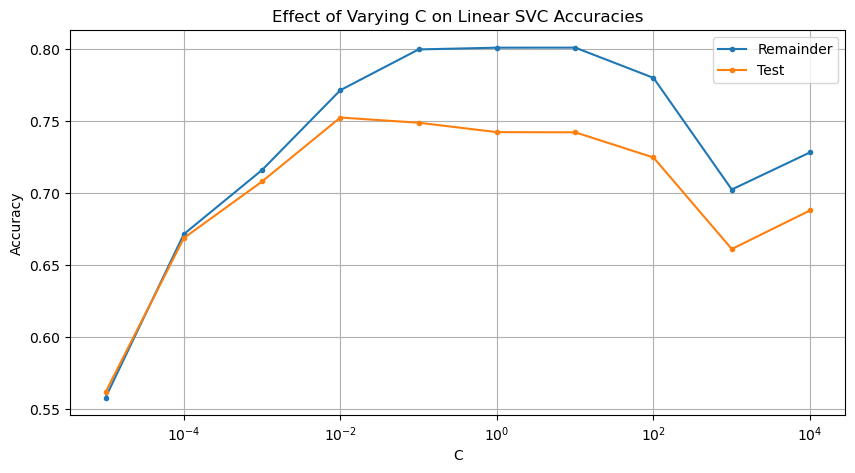

In [188]:
# Plot the accuracies
plt.figure(figsize=(10, 5))
plt.plot(c_values, remainder_accuracies, label='Remainder', marker='.')
plt.plot(c_values, test_accuracies, label='Test', marker='.')
plt.legend()
plt.title('Effect of Varying C on Linear SVC Accuracies')
plt.xscale('log') # Put the x-axis on a log scale; this is important because the C values vary in orders of magnitude
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

Based on the plot above, a C_value of 0.01 seems to be giving the best result, where the remainder and test accuracies are relatively close. It can also be seen that a C_value greater than 0.01 causes the the Test accuracy to start dropping.

We have better results in SVC rather than logistic regression model and our test accuracy is slightly better 75.24%.

Lets re-run the Linear SVC with a C_value of 0.01 and check the accuracies:

In [189]:
# Instantiate a linear SVC and fit to the remainder set
lin_svm = LinearSVC(C= 0.01, random_state=17).fit(X_remainder_tfidf_scaled, y_remainder_sample)

# Score on the model
print(f'Linear SVC accuracy on the remainder set with a C_value of 0.01 is {round(lin_svm.score(X_remainder_tfidf_scaled, y_remainder_sample)*100, 2)}%')
print(f'Linear SVC accuracy on the test set with a C_value of 0.01 is {round(lin_svm.score(X_test_tfidf_scaled, y_test_sample)*100, 2)}%')

Linear SVC accuracy on the remainder set with a C_value of 0.01 is 77.14%
Linear SVC accuracy on the test set with a C_value of 0.01 is 75.24%


- Up until now SVC is our best model with 75.24% test accuracy.

### Random Forest Optimization

The number of estimators parameter optimization will follow a similar approach as the LogisticRegression optimization above.

In [190]:
from sklearn.ensemble import RandomForestClassifier

# Let's try this range of estimators
n_estimators = range(1, 32, 2)

# Create empty lists for storing the accuracy results of each C value
remainder_accuracies = []
test_accuracies = []

# Iterate through the number of estimators range
for n in n_estimators:
    print(f"Working on n={n}...", end="\r")

    # Instantiate RandomForest and fit to the remainder set
    RF_model = RandomForestClassifier(n_estimators=n, max_depth=None, random_state=17)
    RF_model.fit(X_remainder_tfidf_scaled, y_remainder_sample)
    
    # Score on the remainder set and append this accuracy to its respective list
    remainder_accuracies.append(RF_model.score(X_remainder_tfidf_scaled, y_remainder_sample))

    # Score on the test set and append this accuracy to its respective list
    test_accuracies.append(RF_model.score(X_test_tfidf_scaled, y_test_sample))

In [191]:
# Check the accuracies

pd.DataFrame({'n estimators': n_estimators, 'remainder accuracy': remainder_accuracies, 'test accuracy': test_accuracies})

,n estimators,remainder accuracy,test accuracy
0,1,0.867499,0.628667
1,3,0.943017,0.659200
2,5,0.971509,0.690267
3,7,0.985110,0.707333
4,9,0.991599,0.721200
5,11,0.994311,0.731733
6,13,0.996266,0.735067
7,15,0.997733,0.747067
8,17,0.998755,0.750267
9,19,0.999422,0.756267


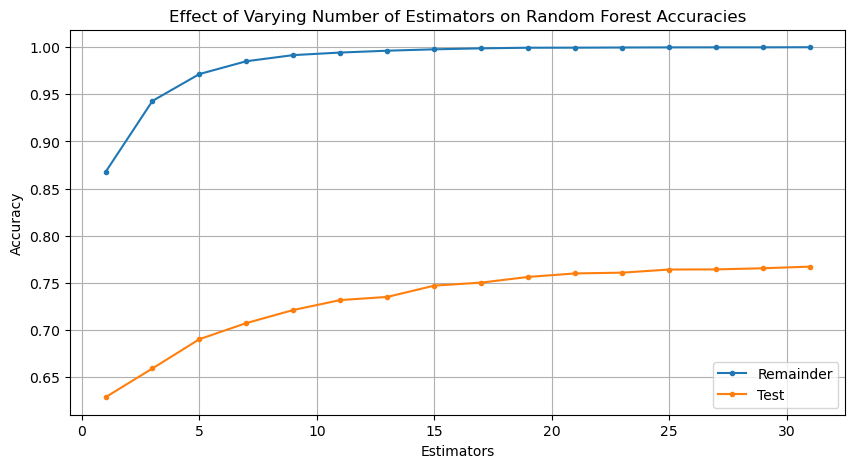

In [192]:
# Plot the accuracies

plt.figure(figsize=(10, 5))
plt.plot(n_estimators, remainder_accuracies, label='Remainder', marker='.')
plt.plot(n_estimators, test_accuracies, label='Test', marker='.')
plt.legend()
plt.title('Effect of Varying Number of Estimators on Random Forest Accuracies')
plt.xlabel('Estimators')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

The max_depth parameter optimization will follow a similar approach as the LogisticRegression optimization above.

In [193]:
from tqdm.notebook import tqdm_notebook
import time

In [194]:
# Let's try this range of estimators
max_depth_range = range(2, 50, 2)

# Create empty lists for storing the accuracy results of each C value
remainder_accuracies = []
test_accuracies = []

# Iterate through the number of estimators range
for i in tqdm_notebook(range(1)):
    time.sleep(0.5)
    for d in max_depth_range:
        print(f"Working on max_depth={d}...", end="\r")

        # Instantiate RandomForest and fit to the remainder set
        RF_model = RandomForestClassifier(n_estimators=6, max_depth=d, random_state=17)
        RF_model.fit(X_remainder_tfidf_scaled, y_remainder_sample)
        
        # Score on the remainder set and append this accuracy to its respective list
        remainder_accuracies.append(RF_model.score(X_remainder_tfidf_scaled, y_remainder_sample))

        # Score on the test set and append this accuracy to its respective list
        test_accuracies.append(RF_model.score(X_test_tfidf_scaled, y_test_sample))
    pass

  0%|          | 0/1 [00:00<?, ?it/s]

In [195]:
# Check the accuracies

pd.DataFrame({'max depth': max_depth_range, 'remainder accuracy': remainder_accuracies, 'test accuracy': test_accuracies})

,max depth,remainder accuracy,test accuracy
0,2,0.561117,0.566267
1,4,0.590230,0.585467
2,6,0.613210,0.600133
3,8,0.635568,0.610133
4,10,0.651791,0.621067
5,12,0.698329,0.659333
6,14,0.715086,0.663067
7,16,0.740733,0.667867
8,18,0.761223,0.673067
9,20,0.785625,0.667333


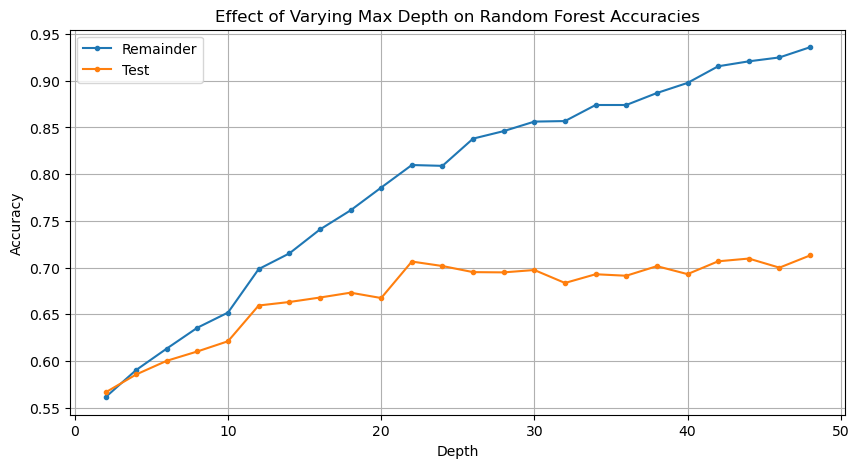

In [196]:
# Plot the accuracies
plt.figure(figsize=(10, 5))
plt.plot(max_depth_range, remainder_accuracies, label='Remainder', marker='.')
plt.plot(max_depth_range, test_accuracies, label='Test', marker='.')
plt.legend()
plt.title('Effect of Varying Max Depth on Random Forest Accuracies')
plt.xlabel('Depth')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

In [197]:
# Instantiate RandomForest and fit to the remainder set
RF_model = RandomForestClassifier(n_estimators=13, max_depth=21, random_state=1)
RF_model.fit(X_remainder_tfidf_scaled, y_remainder_sample)

# Score on the model
print(f'Random Forest accuracy on the remainder set is {round(RF_model.score(X_remainder_tfidf_scaled, y_remainder_sample)*100, 2)}%')
print(f'Random Forest accuracy on the test set is {round(RF_model.score(X_test_tfidf_scaled, y_test_sample)*100, 2)}%')

Random Forest accuracy on the remainder set is 83.85%
Random Forest accuracy on the test set is 73.08%


We get a ~84% accuracy on the remainder, and ~73%. There is a ~10% difference between test and remainder accuracies and we see overfitting which is not good. So far, our SVC model had higher test accuracy and better performance.

### XGBoost Optimization

The number of estimators parameter optimization will follow a similar approach as the LogisticRegression optimization above.


In [198]:
! pip install xgboost

In [199]:
from xgboost import XGBClassifier

# Let's try this range of estimators
n_estimators = range(1, 52, 5)

# Create empty lists for storing the accuracy results of each C value
remainder_accuracies = []
test_accuracies = []

# Iterate through the number of estimators range
for n in n_estimators:
    #for n in tqdm(range(n)):
    print(f"Working on n={n}...", end="\r")
    
    # Instantiate RandomForest and fit to the remainder set
    XGB_model = XGBClassifier(n_estimators=n, max_depth=None, random_state=17)
    XGB_model.fit(X_remainder_tfidf_scaled, y_remainder_sample)

    # Score on the remainder set and append this accuracy to its respective list
    remainder_accuracies.append(XGB_model.score(X_remainder_tfidf_scaled, y_remainder_sample))

    # Score on the test set and append this accuracy to its respective list
    test_accuracies.append(XGB_model.score(X_test_tfidf_scaled, y_test_sample))
    #pass

In [200]:
# Check the accuracies

pd.DataFrame({'n estimators': n_estimators, 'remainder accuracy': remainder_accuracies, 'test accuracy': test_accuracies})

,n estimators,remainder accuracy,test accuracy
0,1,0.705974,0.697867
1,6,0.764646,0.745467
2,11,0.787626,0.761467
3,16,0.804827,0.768800
4,21,0.816206,0.775600
5,26,0.826473,0.782133
6,31,0.832563,0.784000
7,36,0.842119,0.788533
8,41,0.847986,0.789467
9,46,0.853098,0.788000


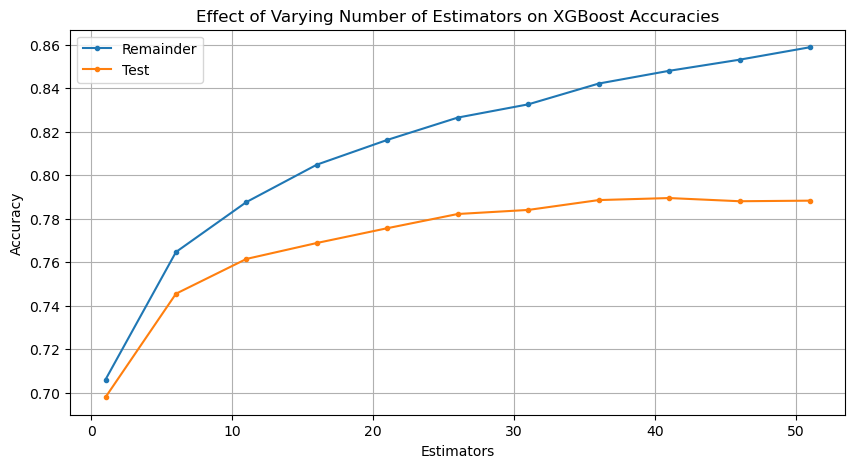

In [201]:
# Plot the accuracies
plt.figure(figsize=(10, 5))
plt.plot(n_estimators, remainder_accuracies, label='Remainder', marker='.')
plt.plot(n_estimators, test_accuracies, label='Test', marker='.')
plt.legend()
plt.title('Effect of Varying Number of Estimators on XGBoost Accuracies')
plt.xlabel('Estimators')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

The model has the best accuracy result with 41 estimators. It is interesting to see that the Test accuracy starts to taper off around 40-42 estimators, indicating that this is most likely the optimal number of estimators for this model. But, it can be seen that the accuracy on the remainder set was still rising, this could be indicative of some over-fitting starting to occur, since the test accuracy is starting to taper off.

Now, I shall try to find the optimal max_depth for the model. The number of estimators will be set to 41 for this run, and the range for the max depth will set to be between 2-10, with an increment of 2.

The max_depth parameter optimization will follow a similar approach as the LogisticRegression optimization above.


In [202]:
# Let's try this range of estimators
max_depth_range = range(2, 10, 2)

# Create empty lists for storing the accuracy results of each C value
remainder_accuracies = []
test_accuracies = []

# Iterate through the number of estimators range
for d in max_depth_range:
    print(f"Working on max_depth={d}...", end="\r")

    # Instantiate RandomForest and fit to the remainder set
    XGB_model = XGBClassifier(n_estimators=46, max_depth=d, random_state=17)
    XGB_model.fit(X_remainder_tfidf_scaled, y_remainder_sample)
    
    # Score on the remainder set and append this accuracy to its respective list
    remainder_accuracies.append(XGB_model.score(X_remainder_tfidf_scaled, y_remainder_sample))

    # Score on the test set and append this accuracy to its respective list
    test_accuracies.append(XGB_model.score(X_test_tfidf_scaled, y_test_sample))

In [203]:
# Check the accuracies

pd.DataFrame({'max depth': max_depth_range, 'remainder accuracy': remainder_accuracies, 'test accuracy': test_accuracies})

,max depth,remainder accuracy,test accuracy
0,2,0.767179,0.757467
1,4,0.812517,0.781733
2,6,0.853098,0.788000
3,8,0.890257,0.791200


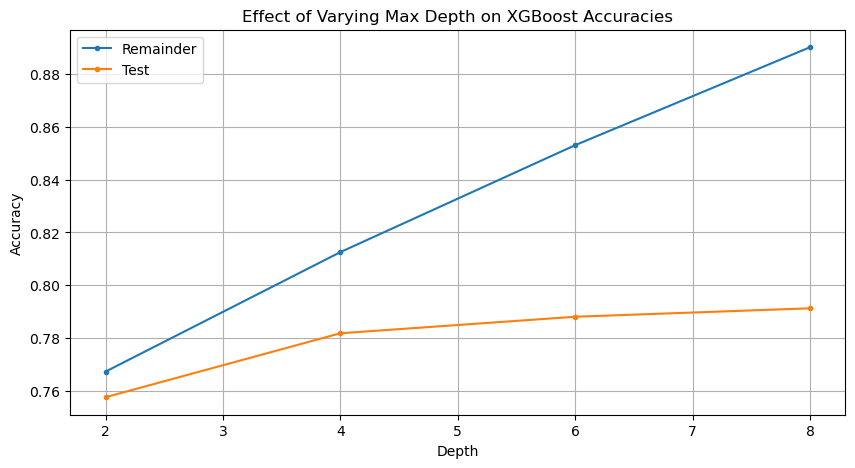

In [204]:
# Plot the accuracies

plt.figure(figsize=(10, 5))
plt.plot(max_depth_range, remainder_accuracies, label='Remainder', marker='.')
plt.plot(max_depth_range, test_accuracies, label='Test', marker='.')
plt.legend()
plt.title('Effect of Varying Max Depth on XGBoost Accuracies')
plt.xlabel('Depth')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

- Seems like the accuracy on the test set starts to taper off around a max_depth of 6, but luckily it is not yet in over-fitting territory.

For this reason, I shall re-run the XGBoost model with a n_estimators value of 40, with a max_depth of 6, and check the accuracies:

In [205]:
# Instantiate RandomForest and fit to the remainder set
XGB_model = XGBClassifier(n_estimators=40, max_depth=6, random_state=17)
XGB_model.fit(X_remainder_tfidf_scaled, y_remainder_sample)

# Score on the model
print(f'XGBoost accuracy on the remainder set is {round(XGB_model.score(X_remainder_tfidf_scaled, y_remainder_sample)*100, 2)}%')
print(f'XGBoost accuracy on the test set is {round(XGB_model.score(X_test_tfidf_scaled, y_test_sample)*100, 2)}%')

XGBoost accuracy on the remainder set is 84.66%
XGBoost accuracy on the test set is 78.96%


We get a 84.6% accuracy on the remainder, and 79% accuracy on the test sets which is really good till now. These remainder accuracy result is the highest we got until now and comparing to our baseline model which was logistic regression with accuracy of 74.7%, is approximately 5% increase in test accuracy which is really good.

Observations:
- Remainder set accuracies:
    * LogisticRegression - 77.3%
    * SVM - 77%
    * Random Forest - 84%
    * XGBoost - 85%
- Test set accuracies have some variance between the models:
    * LogisticRegression - 75%
    * SVM - 75.24%
    * Random Forest - 73%
    * XGBoost - 79%

Summary of optimal values for model hyperparameters:
* LogisticRegression: C_value = 0.1
* SVM: C_value = 0.01
* Random Forest: n_estimators = 13 / max_depth = 21
* XGBoost: n_estimators = 40 / max_depth = 6

Now, that I have some potential optimal values for certain model hyperparameters, I will conduct some Advanced Modelling to further fine-tune and find the best model with the most optimal hyperparameters.

With some manual optimization conducted above, I will be able to reduce the ranges of these hyperparameters during the pipeline and gridsearch stage. A reduction in the ranges will help with the computation times, since models such as Random Forest, and XGBoost are quite time consuming and computationally heavy, especially when run on a laptop/local machine which is not cloud computing.

These will be the ranges for the model hyperparameters:
* LogisticRegression: C_value = [0.01, 0.1, 1]
* SVM: C_value = [0.001, 0.01, 0.1]
* Random Forest: n_estimators = range(13, 18) / max_depth = range(21, 27, 2)
* XGBoost: n_estimators = range(40, 43, 2) / max_depth = range(8, 11, 2)

## 4. Advanced Modeling <a id="header34"></a>

Let's import related packages:

In [206]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA, KernelPCA
import warnings
warnings.filterwarnings("ignore")
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

Lets run the baseline model again:

In [207]:
# 1. Instantiate model
base_logit_tfidf = LogisticRegression(random_state=17)

#2. Fit model
base_logit_tfidf.fit(X_remainder_tfidf_scaled, y_remainder_sample)

# 3. Score model
print(f'Score on remainder: {base_logit_tfidf.score(X_remainder_tfidf_scaled, y_remainder_sample)}')
print(f'Score on test: {base_logit_tfidf.score(X_test_tfidf_scaled, y_test_sample)}')

Score on remainder: 0.799893323851009
Score on test: 0.7470666666666667


We'll keep these accuracies in mind for comparing against the optimal model found by the GridSearch later.

The X_test set can be kept as is for scoring the final model further down the line, but we need to proceed with splitting the X_remainder into X_train and X_validation sets:


### Data Split - Train and Validation

 X and y remainder datasets (without scaling) will be further split into X and y train and validation sets:

In [208]:
# Splitting the original remainder dataset in train and validation sets

X_train, X_validation, y_train, y_validation = train_test_split(X_remainder_vect_tfidf, y_remainder_sample, test_size = 0.2,
                                                                                            random_state = 17, stratify = y_remainder_sample)

In [209]:
#Lets take a look at the shape of the new train and validation datasets

print(f'X_train has {X_train.shape[0]} rows, and {X_train.shape[1]} columns')
print(f'X_validation has {X_validation.shape[0]} rows, and {X_validation.shape[1]} columns')

X_train has 17998 rows, and 2018 columns
X_validation has 4500 rows, and 2018 columns


Lets check if the class proportions have been maintained:

In [210]:
print('Proportions in remainder set:')
print(y_remainder_sample.value_counts(normalize=True), '\n')

print('Proportions in test set:')
print(y_test_sample.value_counts(normalize=True), '\n')

print('Proportions in train set:')
print(y_train.value_counts(normalize=True), '\n')

print('Proportions in validation set:')
print(y_validation.value_counts(normalize=True), '\n')

Proportions in remainder set:
Y
1    0.557827
0    0.442173
dtype: float64 

Proportions in test set:
Y
1    0.5616
0    0.4384
dtype: float64 

Proportions in train set:
Y
1    0.55784
0    0.44216
dtype: float64 

Proportions in validation set:
Y
1    0.557778
0    0.442222
dtype: float64 



### ML Pipeline and GridSearch

First, the esimators need to set-up, these will inlclude the following 3 parameters within it:
- Scaler: the scaler type to be employed for scaling the train and validation datasets
- Model: the type of model which will be employed to running the analysis

For the GridSearch a dimension reducer will not be used due to the fact that reducing the dimentionality resulted in no change in the mnodel accuracy as we saw at PCA section.

Lets set-up the esimators:

In [211]:
# Setting up the estimators and pipeline

estimators = [
    ('scaler', MinMaxScaler()),
    ('model', LogisticRegression())
]

In [212]:
# Set up a directory to cache the pipeline results

from tempfile import mkdtemp
cachedir = mkdtemp()

# Instantiate the pipeline
my_pipe = Pipeline(estimators, memory=cachedir)

### Hyperparameters  for the Pipeline/GridSearch:

#### Logistic Regression

LogisticRegression is the a great and simple model that can be used for classification probelsm. It is quick to run and not very computationally heavy.

Solvers:
* LibLinear - good for high dimension datasets
* SAGA - works well on large datasets with feature matrix that is sparse (contains many 0 values) and allows for L1 regularisation, plus it is less computationally heavy (time-efficient)

Penalty:
* L1 - allows for some dimensionality reduction through regularisation

#### SVM (Support Vector Machines)

SVMs are good for working with high dimentional data such as the vectorised data I have.

Kernels: (I had to remove the kernel parameters due to computational limitations)
* Linear Kernel - used for text categorisation and large sparce datasets
* RBF Kernel - used when there is no prior knowledge of the data and when the number of observation is greater then the number of features and for finding non-linear splits for the classification of the data

#### Random Forest

Random Forest model(bagging method) is good at both regression and classification problems, and works well with large datasets without much runtime comprmise and heavy computation requirements.

Number of Estimators - how many splits the decision tree can make

Max Depth - the limit after which the decision tree will stop splitting

#### XGBoost

XGBoost model is good at working with large datasets.

Number of Estimators - the number of boosting stages

Max Depth - the limit after which the model will stop splitting

Learning Rate - the speed at which a model learns

- Now, the parameters grid needs to be set-up. This will be a compilation of all the different models, and their hyperparameter combinations that I will want to test in order to find the best model with its optimal hyperparameters.

The following scalers, dimension reducers, models, and model hyperparameters will be used:
1. Scalers:
    - MinMax Scaler
2. Models and Hyperparameters:
    - LogisticRegression
        * C_values = [0.01, 0.1, 1]
        * Penalty = l1
        * Solver = liblinear, saga
        * Random State = 17
    - LinearSVM
        * C_values = [0.001, 0.01, 0.1]
        * Penalty = l1, l2
        * Random State = 17
    - Random Forrest
        * Number of estimators = range(13, 18)
        * Max Depth = range(21, 27, 2)
        * Random State = 17
    - XGBoost
        * Number of estimators = range(40, 43, 2)
        * Max Depth = range(8, 11, 2)
        * Random State = 17
        * Learning Rate = [0.5, 1]

Lets start setting up the Parameters Grid:

In [213]:
y_train.shape

(17998, 1)

For using the y_train to fit the GridSearch model, the y_train dataset needs to be converted into an array (only rows). Currently, as seen from the y_train shape check above, there is one column present, this will not work with the GridSearch, and will cause it to throw errors. The y_train dataset nneds to be flattened for fitting to the GridSearch, this can be done using the np.ravel() function:

In [214]:
y_train.values.ravel().shape

(17998,)

In [215]:
# Range of C values to try
c_values = [.01, .1, 1]

# Logistic Regression Parameter grid
logreg_param_grid = [
    
    {'scaler': [MinMaxScaler()],
     'model': [LogisticRegression(penalty = 'l1', random_state = 17)],
     'model__C': c_values,
     'model__solver': ['liblinear', 'saga']}
     ]

In [216]:
# Range of C values to try
c_values = [.001, .01, .1]

# SVM Parameter grid
svm_param_grid = [

    {'scaler': [MinMaxScaler()],
     'model': [LinearSVC(random_state = 17)], 
     'model__C': c_values,
     'model__penalty': ['l1', 'l2']}
   
]

In [217]:
# Random Forest Parameter grid
rf_param_grid = [
     
    {'scaler': [MinMaxScaler()],
     'model': [RandomForestClassifier(random_state = 17)], 
     'model__n_estimators': range(13, 18),
     'model__max_depth': range(21, 27, 2)}

]

In [218]:
# Parameter grid
xgb_param_grid = [

    {'scaler': [MinMaxScaler()],
     'model': [XGBClassifier(random_state = 17)], 
     'model__n_estimators': range(40, 43, 2),
     'model__max_depth': range(6, 9, 2),
     'model__learning_rate': [0.5, 1]}
   
]

In [219]:
# Instantiate the grid search for each model
logreg_grid = GridSearchCV(my_pipe, param_grid = logreg_param_grid, cv = 5, verbose = 2)

svm_grid = GridSearchCV(my_pipe, param_grid = svm_param_grid, cv = 5, verbose = 2)

rf_grid = GridSearchCV(my_pipe, param_grid = rf_param_grid, cv = 5, verbose = 2)

xgb_grid = GridSearchCV(my_pipe, param_grid = xgb_param_grid, cv = 5, verbose = 2)

In [220]:
# Fit the grid search for Logistic Regression model

logreg_fitted_grid = logreg_grid.fit(X_train, y_train.values.ravel())

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END model=LogisticRegression(penalty='l1', random_state=17), model__C=0.01, model__solver=liblinear, scaler=MinMaxScaler(); total time=   6.8s
[CV] END model=LogisticRegression(penalty='l1', random_state=17), model__C=0.01, model__solver=liblinear, scaler=MinMaxScaler(); total time=   5.9s
[CV] END model=LogisticRegression(penalty='l1', random_state=17), model__C=0.01, model__solver=liblinear, scaler=MinMaxScaler(); total time=   5.6s
[CV] END model=LogisticRegression(penalty='l1', random_state=17), model__C=0.01, model__solver=liblinear, scaler=MinMaxScaler(); total time=   5.7s
[CV] END model=LogisticRegression(penalty='l1', random_state=17), model__C=0.01, model__solver=liblinear, scaler=MinMaxScaler(); total time=   5.8s
[CV] END model=LogisticRegression(penalty='l1', random_state=17), model__C=0.01, model__solver=saga, scaler=MinMaxScaler(); total time=  19.1s
[CV] END model=LogisticRegression(penalty='l1', random_st

In [221]:
# Fit the grid search for SVC model


svm_fitted_grid = svm_grid.fit(X_train, y_train.values.ravel())

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l1, scaler=MinMaxScaler(); total time=   1.2s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l1, scaler=MinMaxScaler(); total time=   1.0s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l1, scaler=MinMaxScaler(); total time=   1.0s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l1, scaler=MinMaxScaler(); total time=   1.3s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l1, scaler=MinMaxScaler(); total time=   1.1s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l2, scaler=MinMaxScaler(); total time=   1.6s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l2, scaler=MinMaxScaler(); total time=   1.3s
[CV] END model=LinearSVC(random_state=17), model__C=0.001, model__penalty=l2, scaler=MinMaxScaler();

In [222]:
# Fit the grid search for Random Forest model

rf_fitted_grid = rf_grid.fit(X_train, y_train.values.ravel())

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, model__n_estimators=13, scaler=MinMaxScaler(); total time=   2.6s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, model__n_estimators=13, scaler=MinMaxScaler(); total time=   2.1s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, model__n_estimators=13, scaler=MinMaxScaler(); total time=   2.3s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, model__n_estimators=13, scaler=MinMaxScaler(); total time=   2.2s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, model__n_estimators=13, scaler=MinMaxScaler(); total time=   2.1s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, model__n_estimators=14, scaler=MinMaxScaler(); total time=   2.3s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=21, mode

[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=14, scaler=MinMaxScaler(); total time=   3.0s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=14, scaler=MinMaxScaler(); total time=   3.0s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=14, scaler=MinMaxScaler(); total time=   2.7s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=15, scaler=MinMaxScaler(); total time=   2.6s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=15, scaler=MinMaxScaler(); total time=   2.6s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=15, scaler=MinMaxScaler(); total time=   2.5s
[CV] END model=RandomForestClassifier(random_state=17), model__max_depth=25, model__n_estimators=15, scaler=MinMaxScaler(); total time=   2.8s

In [223]:
# Fit the grid search for XGBoost model

xgb_fitted_grid = xgb_grid.fit(X_train, y_train.values.ravel())

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=17, ...), model__learning_rate=0.5, model__max_depth=6, model__n_estimators=40, scaler=MinMaxScaler(); total time=  22.9s
[CV] END model=XGBClassifier(base_score=None, booster=None, ca

[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=17, ...), model__learning_rate=0.5, model__max_depth=8, model__n_estimators=40, scaler=MinMaxScaler(); total time=  17.3s
[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsampl

[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=17, ...), model__learning_rate=1, model__max_depth=6, model__n_estimators=40, scaler=MinMaxScaler(); total time=  15.3s
[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_

[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=17, ...), model__learning_rate=1, model__max_depth=8, model__n_estimators=40, scaler=MinMaxScaler(); total time=  17.7s
[CV] END model=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_

### Best Models and params

In [224]:
# Checking for the best hyperparameters combination for each model

print(logreg_fitted_grid.best_estimator_)

print(svm_fitted_grid.best_estimator_)

print(rf_fitted_grid.best_estimator_)

print(xgb_fitted_grid.best_estimator_)

Pipeline(memory='C:\\Users\\mahya\\AppData\\Local\\Temp\\tmp_53kt7of',
         steps=[('scaler', MinMaxScaler()),
                ('model',
                 LogisticRegression(C=1, penalty='l1', random_state=17,
                                    solver='liblinear'))])
Pipeline(memory='C:\\Users\\mahya\\AppData\\Local\\Temp\\tmp_53kt7of',
         steps=[('scaler', MinMaxScaler()),
                ('model', LinearSVC(C=0.1, random_state=17))])
Pipeline(memory='C:\\Users\\mahya\\AppData\\Local\\Temp\\tmp_53kt7of',
         steps=[('scaler', MinMaxScaler()),
                ('model',
                 RandomForestClassifier(max_depth=25, n_estimators=17,
                                        random_state=17))])
Pipeline(memory='C:\\Users\\mahya\\AppData\\Local\\Temp\\tmp_53kt7of',
         steps=[('scaler', MinMaxScaler()),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, cols

In [225]:
# Print the accuracies from the best models

print(f"The best logistic regression's accuracy on the validation set: {logreg_fitted_grid.best_estimator_.score(X_validation, y_validation)}")
print(f"The best logistic regression's accuracy on the remainder set: {logreg_fitted_grid.best_estimator_.score(X_remainder_vect_tfidf, y_remainder_sample)}")
print(f"The best logistic regression's accuracy on the test set: {logreg_fitted_grid.best_estimator_.score(X_test_vect_tfidf, y_test_sample)}\n")

print(f"The best svm's accuracy on the validation set: {svm_fitted_grid.best_estimator_.score(X_validation, y_validation)}")
print(f"The best svm's accuracy on the remainder set: {svm_fitted_grid.best_estimator_.score(X_remainder_vect_tfidf, y_remainder_sample)}")
print(f"The best svm's accuracy on the test set: {svm_fitted_grid.best_estimator_.score(X_test_vect_tfidf, y_test_sample)}\n")

print(f"The best random forest's accuracy on the validation set: {rf_fitted_grid.best_estimator_.score(X_validation, y_validation)}")
print(f"The best random forest's accuracy on the remainder set: {rf_fitted_grid.best_estimator_.score(X_remainder_vect_tfidf, y_remainder_sample)}")
print(f"The best random forest's accuracy on the test set: {rf_fitted_grid.best_estimator_.score(X_test_vect_tfidf, y_test_sample)}\n")

print(f"The best xgboost's accuracy on the validation set: {xgb_fitted_grid.best_estimator_.score(X_validation, y_validation)}")
print(f"The best xgboost's accuracy on the remainder set: {xgb_fitted_grid.best_estimator_.score(X_remainder_vect_tfidf, y_remainder_sample)}")
print(f"The best xgboost's accuracy on the test set: {xgb_fitted_grid.best_estimator_.score(X_test_vect_tfidf, y_test_sample)}\n")

# Print the accuracies from the baseline LogisticRegression for comparison
print(f'Baseline LogisticRegression accuracy on remainder set: {base_logit_tfidf.score(X_remainder_tfidf_scaled, y_remainder_sample)}')
print(f'Baseline LogisticRegression accuracy on test set: {base_logit_tfidf.score(X_test_tfidf_scaled, y_test_sample)}')

The best logistic regression's accuracy on the validation set: 0.7537777777777778
The best logistic regression's accuracy on the remainder set: 0.7913592319317273
The best logistic regression's accuracy on the test set: 0.7422666666666666

The best svm's accuracy on the validation set: 0.7557777777777778
The best svm's accuracy on the remainder set: 0.7939816872610899
The best svm's accuracy on the test set: 0.7457333333333334

The best random forest's accuracy on the validation set: 0.7408888888888889
The best random forest's accuracy on the remainder set: 0.8618543870566272
The best random forest's accuracy on the test set: 0.7408

The best xgboost's accuracy on the validation set: 0.7884444444444444
The best xgboost's accuracy on the remainder set: 0.8865232465108009
The best xgboost's accuracy on the test set: 0.7825333333333333

Baseline LogisticRegression accuracy on remainder set: 0.799893323851009
Baseline LogisticRegression accuracy on test set: 0.7470666666666667


Summary of Best GridSearch Model results that will be further evaluated:

The XGBoost Model that I optimized manualy have the best results among all:

 - XGBoost accuracy on the remainder set is 84.66%

 - XGBoost accuracy on the test set is 78.96%

 - XGBoost: n_estimators = 40 / max_depth = 6




Summary of Best GridSearch Model results:


| GridSearch Best Model | Model Parameters/Estimators                                              | Validation Accuracy (%) | Remainder Accuracy (%) | Test Accuracy (%) |
|-----------------------|--------------------------------------------------------------------------|:-----------------------:|:----------------------:|:-----------------:|
| XGBoost               | learning_rate = 0.5, max_depth = 8, n_estimators = 40, random_state = 17 |          78.84          |          88.65         |       78.25       |

Summary of Baseline Logistic Regression Model results:

| Baseline Model      | Default Model Parameters                | Remainder Accuracy (%) | Test Accuracy (%) |
|---------------------|-----------------------------------------|:----------------------:|:-----------------:|
| Logistic Regression | C = 1, penalty = 'l2', solver = 'lbfgs' |          79.98         |       74.7       |



### Model Evaluation and Comparison



- Lets start by evalutating the GridSearch XGBoost model:

In [226]:
# Import libraries for evaluation
from sklearn.metrics import plot_confusion_matrix, confusion_matrix, classification_report, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import mean_absolute_error, r2_score

In [227]:
# Checking the results of the XGBoost model run
results_xgb = pd.DataFrame(xgb_fitted_grid.cv_results_)
results_xgb

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model,param_model__learning_rate,param_model__max_depth,param_model__n_estimators,param_scaler,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,22.320501,1.883179,0.486410,0.074476,"XGBClassifier(base_score=None, booster=None, c...",0.5,6,40,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.770278,0.763056,0.779167,0.780495,0.779383,0.774476,0.006788,4
1,17.408663,4.029395,0.399075,0.083599,"XGBClassifier(base_score=None, booster=None, c...",0.5,6,42,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.769444,0.764722,0.782778,0.776327,0.779383,0.774531,0.006586,3
2,17.412456,0.251232,0.393682,0.086296,"XGBClassifier(base_score=None, booster=None, c...",0.5,8,40,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.763611,0.766111,0.788333,0.789108,0.777716,0.776976,0.010709,1
3,21.065008,1.125123,0.446088,0.040100,"XGBClassifier(base_score=None, booster=None, c...",0.5,8,42,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.762500,0.766111,0.786944,0.787997,0.777160,0.776143,0.010440,2
4,14.660389,0.962216,0.378051,0.070890,"XGBClassifier(base_score=None, booster=None, c...",1,6,40,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.763333,0.750556,0.760000,0.770492,0.759655,0.760807,0.006438,7
5,15.175669,0.770774,0.349960,0.050166,"XGBClassifier(base_score=None, booster=None, c...",1,6,42,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.758333,0.751667,0.757222,0.769380,0.760211,0.759363,0.005761,8
6,18.113541,1.689154,0.406097,0.053767,"XGBClassifier(base_score=None, booster=None, c...",1,8,40,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.753889,0.754722,0.765000,0.766602,0.764935,0.761030,0.005529,6
7,19.575179,1.496003,0.405473,0.075928,"XGBClassifier(base_score=None, booster=None, c...",1,8,42,MinMaxScaler(),"{'model': XGBClassifier(base_score=None, boost...",0.755278,0.753333,0.765278,0.768825,0.763545,0.761252,0.005953,5


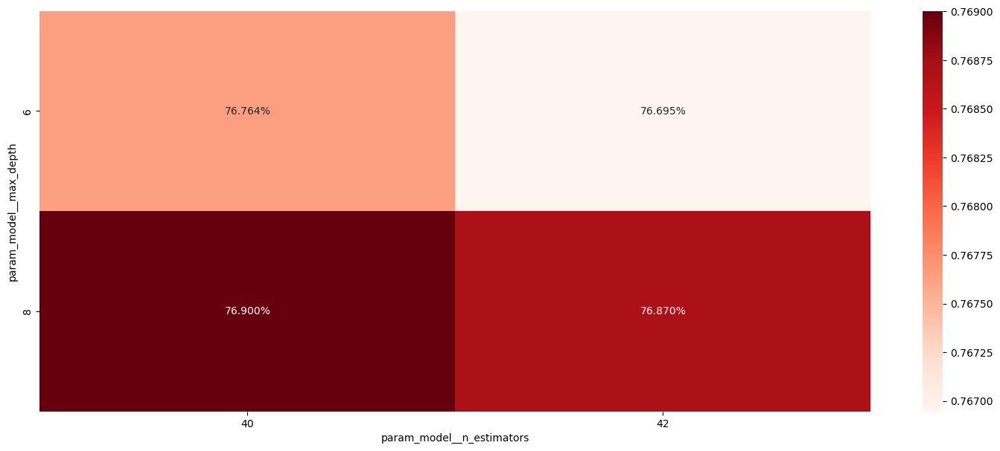

In [228]:
# Lets plot a heatmap for ease of interpretability
sns.heatmap(
    results_xgb.reset_index().pivot_table(index = "param_model__max_depth", columns = "param_model__n_estimators", values = "mean_test_score"),
    cmap = "Reds", annot = True, fmt = "0.3%"
)
plt.show()

As seen from the heatmap above, the best parameters were a max_depth of 8, and 40 number of estimators.

Lets now check the Mean Absolute Erros and R-square values for the XGBoost model:


In [229]:
# Getting the predictions
xgb_y_pred_rem = xgb_fitted_grid.best_estimator_.predict(X_remainder_vect_tfidf)
xgb_y_pred_test = xgb_fitted_grid.best_estimator_.predict(X_test_vect_tfidf)

In [230]:
# Evaluate Model
print(f'GS XGBoost Remainder MAE --- {mean_absolute_error(y_remainder_sample, xgb_y_pred_rem)}')
print(f'GS XGBoost Test MAE ---- {mean_absolute_error(y_test_sample, xgb_y_pred_test)}')
print(f'GS XGBoost Remainder R2 ---- {r2_score(y_remainder_sample, xgb_y_pred_rem)}')
print(f'GS XGBoost Test R2 ----- {r2_score(y_test_sample, xgb_y_pred_test)}')

GS XGBoost Remainder MAE --- 0.11347675348919904
GS XGBoost Test MAE ---- 0.21746666666666667
GS XGBoost Remainder R2 ---- 0.5399392057824193
GS XGBoost Test R2 ----- 0.1167268007292338


Since, this is a classification problem, the MAE and R2 values do not shed any clear light on the model evalutaions.

Instead I shall plot the confusion matrix, and check the precision, recall, and F1 score. After that a quick plot for checking the change in the y_proba threshold and its effect on the precision and recall will be checked.

Lets plot the confusion matrix:

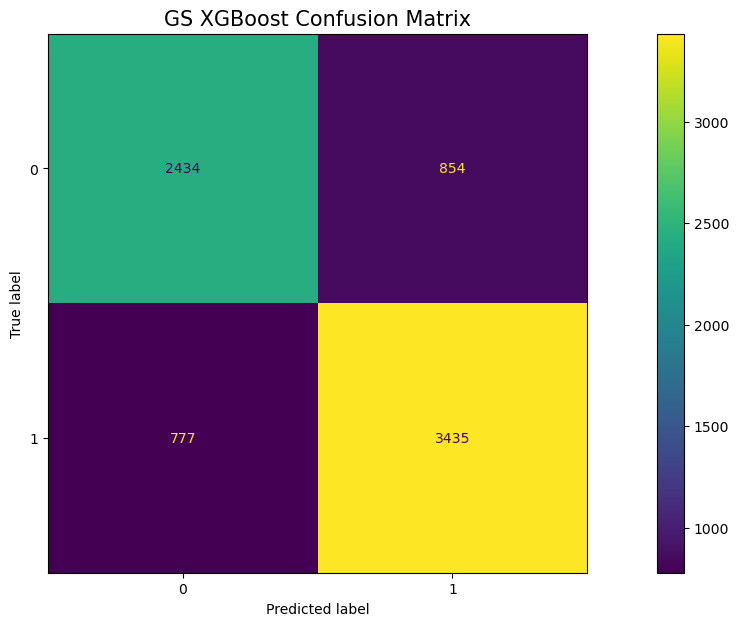

In [231]:
# Lets plot the confusion matrix to get a clearer view
# the function expects the estimator, inputs and target as parameters
plot_confusion_matrix(xgb_fitted_grid.best_estimator_, X_test_vect_tfidf, y_test_sample)
plt.grid(False)
plt.title('GS XGBoost Confusion Matrix', fontsize=15)
plt.show()

In [232]:
# Get class predictions
y_pred_xgb_gs = xgb_fitted_grid.best_estimator_.predict(X_test_vect_tfidf)

#Now the classification report can be generated
report_xgb = classification_report(y_test_sample, y_pred_xgb_gs)
print(report_xgb)

              precision    recall  f1-score   support

           0       0.76      0.74      0.75      3288
           1       0.80      0.82      0.81      4212

    accuracy                           0.78      7500
   macro avg       0.78      0.78      0.78      7500
weighted avg       0.78      0.78      0.78      7500



For this model we have an overall accuraxy of ~79% which matches the accuracy for the test set from the checks done earlier. This is a good accuracy score overall for this dataset, and we have a good recall rate of 82% for the High Quality question, with a 80% precision. These are good results, meaning that out of all the possible HQ questions the model was able to correctly able to identify 82% of them, with 18% misclassification. 


The F1 score is the harmonic mean of the precision and recall rates. An F1 score of 0.78 is good.



- A quick check to try and increase the recall rate can be done by lowering the y_proba (classification probability rate) from the default value of 0.5, to an updated value of 0.2. Lets see what affect it has:

In [233]:
# Make probabilistic predictions (scores)

y_proba_xgb_gs = xgb_fitted_grid.best_estimator_.predict_proba(X_test_vect_tfidf)[:,1]

In [234]:
# First calculate precision and recall using the default (0.5) cut-off

y_threshold_xgb_gs = np.where(y_proba_xgb_gs > 0.5, 1, 0)
print("Threshold of 0.5:")
print(f"Precision score: {precision_score(y_test_sample, y_threshold_xgb_gs)}")
print(f"Recall score: {recall_score(y_test_sample, y_threshold_xgb_gs)}")
print(f"F1 score: {f1_score(y_test_sample, y_threshold_xgb_gs)}")
print("")

# Calculate the same using a lower cut-off (0.2)
y_threshold_xgb_gs = np.where(y_proba_xgb_gs > 0.2, 1, 0)
print("Threshold of 0.2:")
print(f"Precision score: {precision_score(y_test_sample, y_threshold_xgb_gs)}")
print(f"Recall score: {recall_score(y_test_sample, y_threshold_xgb_gs)}")
print(f"F1 score: {f1_score(y_test_sample, y_threshold_xgb_gs)}")

Threshold of 0.5:
Precision score: 0.8008859874096526
Recall score: 0.8155270655270656
F1 score: 0.8081402187977884

Threshold of 0.2:
Precision score: 0.6748719643152156
Recall score: 0.9698480531813866
F1 score: 0.7959084266926448


Summary of results:
    
- By having Threshold goes down:
1. We predict more questions as HQ
2. We get more false positives which drives the precision down
3. We get more true positives that drive the recall up

**So by reducing our y_proba threshold from 0.5 to 0.2, we are seeing a 16% increase in the recall, but we also have a 12% drop in the accuracy.**

**Getting a 16% increase in the recall rate is huge! To put it into contect, if a million reviews are being misclassified on the daily, by changing the y_proba rate to 0.2 instead of the default 0.5, an extra 160,000 HQ questions will be correctly identified as HQ. This would have a positive impact on reducing the costs associated with misclassified questions quality rating.**


- Let's recall the confusion matrix of our Baseline Logistic Regression model:

Text(0.5, 1.0, 'TF-IDF LogReg Confusion Matrix')

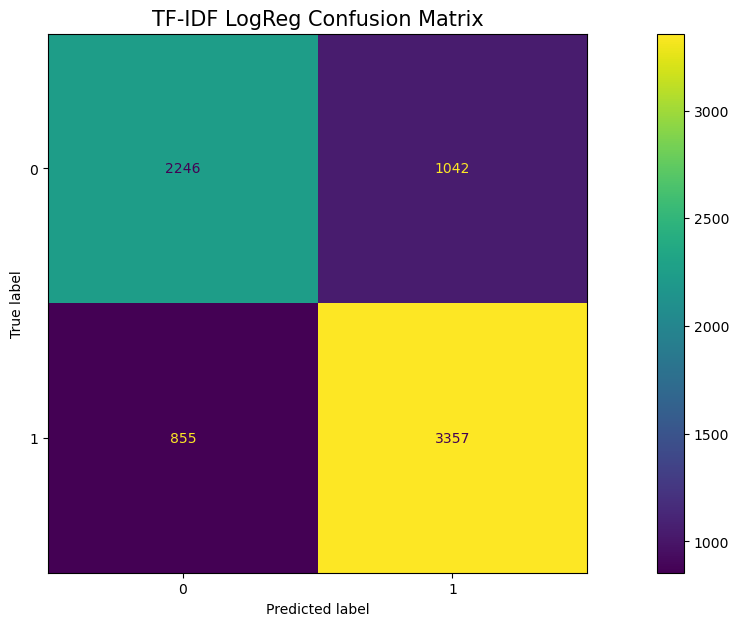

In [235]:
# the function expects the estimator, inputs and target as parameters
plot_confusion_matrix(base_logit_tfidf, X_test_tfidf_scaled, y_test_sample)
plt.grid(False)
plt.title('TF-IDF LogReg Confusion Matrix', fontsize=15)

In [236]:
#Importing the classification report library
from sklearn.metrics import classification_report

#Now the classification report can be generated
report_initial = classification_report(y_test_sample, y_pred)
print(report_initial)

              precision    recall  f1-score   support

           0       0.72      0.68      0.70      3288
           1       0.76      0.80      0.78      4212

    accuracy                           0.75      7500
   macro avg       0.74      0.74      0.74      7500
weighted avg       0.75      0.75      0.75      7500



- As we can see here our XGBoost model has higher recall, presicion and test accuracy results than our baseline model and **XGBoost is my Final model.**

- To do more analysis on my data, I am going to save my dataset in csv files and do more analysis in deeplearning environment on supplemantry second notebook ( mahyar_sabouniaghdam_deeplearning_notebook_capstone_project ): 

In [237]:
# Saving the datasets into a CSV file

X_remainder_vect_tfidf.to_csv('X_remainder_vect_tfidf.csv', index = False)
X_test_vect_tfidf.to_csv('X_test_vect_tfidf.csv', index = False)
y_remainder_sample.to_csv('y_remainder.csv', index = False)
y_test_sample.to_csv('y_test.csv', index = False)

# Part 4: Conclusion & Next Steps <a id="pt4"></a>

## 1. Final insights and models, next steps, and conclusion <a id="next"></a>

### Final Insights:

- As we saw on the supplemantry notebook for deeplearning XGBoost is still our best model, The next check for my XGBoost model is to plot out the change in the precision and recall scores based on a range of threshold values. By doing this I aim to find the optimal threhold value which would lead to the highest recall rate:

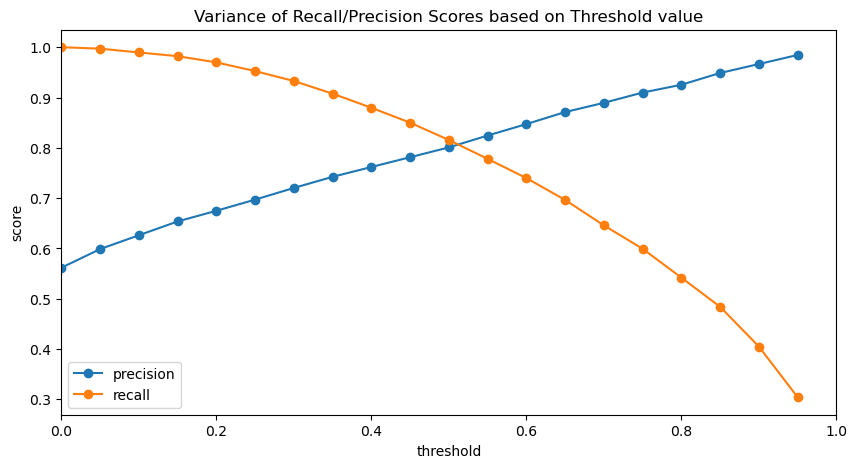

In [238]:
# Vary thresholds by 0.05 from 0.05 to 0.95
thresholds = np.arange(0, 1, 0.05)

precisions = list()
recalls = list()

for threshold in thresholds:

    # Apply threshold
    y_threshold = np.where(y_proba_xgb_gs > threshold, 1, 0)
    
    # Calculate precision and recall
    precision = precision_score(y_test_sample, y_threshold)
    recall = recall_score(y_test_sample, y_threshold)
    
    # Append to list
    precisions.append(precision)
    recalls.append(recall)

# Visualize the result
plt.figure(figsize=(10, 5))
plt.plot(thresholds, precisions, label='precision', marker='o')
plt.plot(thresholds, recalls, label='recall', marker='o')
plt.xlim(0, 1)
plt.xlabel('threshold')
plt.ylabel('score')
plt.title('Variance of Recall/Precision Scores based on Threshold value')
plt.legend()

From the plot above, it looks like that the optimal threshold value might be between 0.2 and 0.4 (High recall score area). 

Deciding the final threshold would depend on a few real-world factors such as:
- Industry or Company standard (what is the min % of HQ question rating to be recognized)
- The cost associated with misclassifying a closed question for not HQ question and vice versa



As a final check for comparing the true positive rates (TPR - how many HQ questions are correctly being classified as HQ AKA recall) and false positive rates (FPR - how many closed questions are being misclassified as HQ question), the Receiver Operating Characteristic (ROC) curve will be plot.

Via the ROC Curve I aim to check the Area Under the Curve (AUC) value which represents how well the model is able to distinguish between the closed and HQ questions.

AUC Score definition:

- 1 = model is perfectly able to distinguish between closed and HQ questions
- 0.5 = model is unable to distinguish between closed and HQ questions
- 0 = the model is predicting all closed questions as HQ and vice versa


Lets plot the ROC-AUC now:

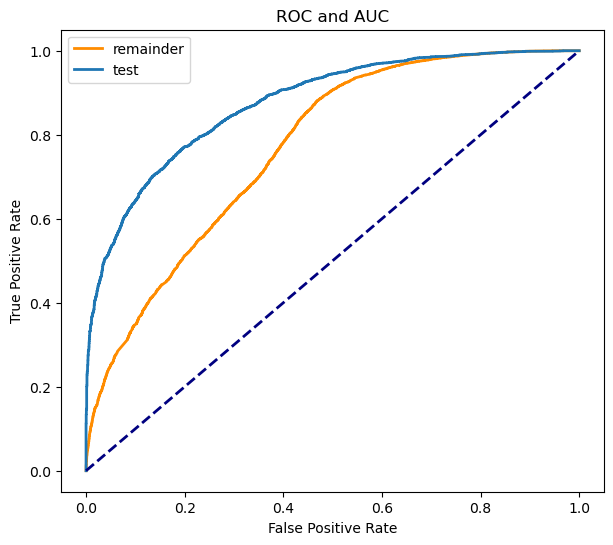

Test AUC score: 0.8752335538248961
RemainderAUC score: 0.7682892595280317


In [239]:
# Import the ROC and AUC libraries
from sklearn.metrics import roc_curve, roc_auc_score

# Get class predictions
y_proba_xgb_test = xgb_fitted_grid.best_estimator_.predict_proba(X_test_vect_tfidf)[:,1]
y_proba_xgb_rem = xgb_fitted_grid.best_estimator_.predict_proba(X_remainder_tfidf_scaled)[:,1]

# Set-up the FPR, TPR, and thresholds
fprs, tprs, thresholds = roc_curve(y_test_sample.values.ravel(), y_proba_xgb_test)
roc_auc = roc_auc_score(y_test_sample.values.ravel(), y_proba_xgb_test)
fprs_rem, tprs_rem, thresholds_rem = roc_curve(y_remainder_sample, y_proba_xgb_rem)
roc_auc_rem = roc_auc_score(y_remainder_sample, y_proba_xgb_rem)
  
# Plot the ROC curve.
plt.figure(figsize=(7, 6))
plt.plot(fprs_rem, tprs_rem, color='darkorange', lw=2, label='remainder')
plt.plot(fprs, tprs, lw=2, label='test')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC and AUC')
plt.legend(loc="best")

plt.show()
print(f"Test AUC score: {roc_auc}")
print(f"RemainderAUC score: {roc_auc_rem}")

**Based on the AUC score, there is a ~0.88 probability that the classifier will correctly classify a randomly chosen HQ question. This is a good result, indicating that the model will perform good for the HQ question recognizer.**

### Final Model & Next Steps:



Based on all the advanced modelling conducted in this notebook and deeplearning supplemantry notebook, the XGBoost model with the manual hyperparameters was the most successful at classifying the closed and HQ Questions.

Best Model Parameters:

| Model                          |         Default Model Parameters        | Remainder Accuracy (%) | Test Accuracy (%) |
|--------------------------------|:---------------------------------------:|:----------------------:|:-----------------:|
| XGBoost                        | learning_rate = 0.5, max_depth = 6, n_estimators = 40, random_state = 17 |          84.7%         |       79%       |






### Next Steps:


On any project, there will always be areas for improvement or further work. This is especially true when there are time and computational limitations (such as is the case with this project). Some areas this work could be furthered or improved include:


- Search for less biased data
- Engineer some features from the dataset
- Conduct a WordEmbedding analysis
- Run an ML Pipeline with GridSearch on a wider array or models and hyperparameters (possibly via AWS due to computational limits with local machine)
- Develop an API to predict the quality rating of the questions